In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import config
import sklearn
from sklearn import metrics
from tqdm import tqdm
import config
import designimg as d
import glob

In [100]:
glob.glob(f'{config.RESIZED_IMAGE_PATH}train/*.npy')

[]

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import os
import config
import designimg as d
import dataset as a
import glob
i = a.SetiDataset(glob.glob(f'{config.RESIZED_IMAGE_PATH}train/*.npy'), targets = [1], ids =[0], resize=None, augmentations = None)[0]
plt.figure()
plt.imshow(i['images'][0])
plt.show()

In [30]:
oof_path = f'/home/asajw/SETI/output/efficientnet_b0_dt0607/auc_oof_df_efficientnet_b0_bs32_size256_dt0607.csv'

In [31]:
oof = pd.read_csv(oof_path)
oof.head()

,predictions,targets,target_ids
0,0.009920,0.0,12676
1,0.937007,1.0,19422
2,0.018443,0.0,8773
3,0.005836,0.0,24066
4,0.003933,0.0,39084


In [32]:
oof.targets.value_counts()

0.0    45471
1.0     4694
Name: targets, dtype: int64

In [33]:
# defining tp, tn, fp, fn from basic

class Metrics():
    def __init__(self, ytrue, ypred):
        self.ytrue = ytrue
        self.ypred = ypred
        
    def true_pos(self):
        tp = 0
        for yt, yp in zip(self.ytrue, self.ypred):
            if yt == 1 and yp == 1:
                tp += 1
        return tp

    def true_neg(self):
        tn = 0
        for yt, yp in zip(self.ytrue, self.ypred):
            if yt == 0 and yp == 0:
                tn += 1
        return tn

    def false_pos(self):
        fp = 0
        for yt, yp in zip(self.ytrue, self.ypred):
            if yt == 0 and yp == 1:
                fp += 1
        return fp

    def false_neg(self):
        fn = 0
        for yt, yp in zip(self.ytrue, self.ypred):
            if yt == 1 and yp == 0:
                fn += 1
        return fn

    def precision(self):
        tp = self.true_pos()
        fp = self.false_pos()
        return tp / (tp + fp)

    def recall(self):
        tp = self.true_pos()
        fn = self.false_neg()  
        return tp / (tp + fn)
    
    def f1(self):
        p = self.precision()
        r = self.recall()
        return 2*p*r / (p +r)
    
    def tpr(self):
        return self.recall()
    
    def fpr(self):
        fp = self.false_pos()
        tn = self.true_neg()
        return fp / (fp + tn)
    
    def roc_auc(self):
        return metrics.roc_auc_score(self.ytrue, self.ypred)
    
    

In [45]:
thresholds = [x*oof.predictions.max()/1000 for x in range(int(oof.predictions.max()*1000))]

In [46]:
mDF = pd.DataFrame({
                    'threshold':[],
                    'fp':[], 'fn':[], 'tn':[], 'tp':[],
                    'precision':[], 'recall':[],
                    'tpr':[], 'fpr':[],
                    'f1':[], 'roc_threshold':[],
                    })


In [47]:
for i, threshold in tqdm(enumerate(thresholds)):
    ypred = oof['predictions'].values.tolist()
    ypred = [1 if y > threshold else 0 for y in ypred]
    ytrue = oof['targets'].values.tolist()
    m = Metrics(ytrue, ypred)
    mDF.loc[i, 'threshold'] = threshold
    mDF.loc[i, 'fp'] = m.false_pos()
    mDF.loc[i,'fn'] = m.false_neg()
    mDF.loc[i,'tp'] = m.true_pos()
    mDF.loc[i,'tn'] = m.true_neg()
    mDF.loc[i,'precision'] = m.precision()
    mDF.loc[i,'recall'] = m.recall()
    mDF.loc[i,'tpr'] = m.tpr()
    mDF.loc[i,'fpr'] = m.fpr()
    mDF.loc[i,'f1'] = m.f1()
    mDF.loc[i,'roc_threshold'] = m.roc_auc()

969it [01:12, 13.42it/s]


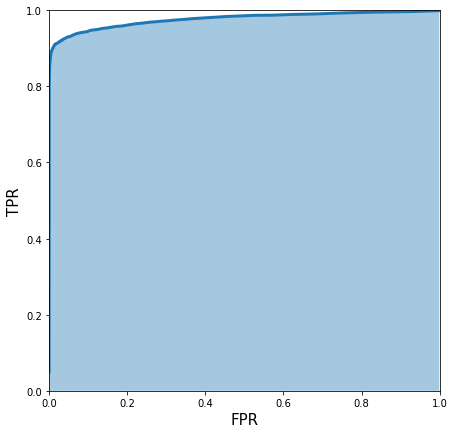

In [48]:
plt.figure(figsize=(7,7))
plt.fill_between(mDF['fpr'].values.tolist(), mDF['tpr'].values.tolist(), alpha = 0.4)
plt.plot(mDF['fpr'].values.tolist(), mDF['tpr'].values.tolist(), lw = 3)
plt.xlim(0, 1.0)
plt.ylim(0, 1.0)
plt.xlabel('FPR', fontsize = 15)
plt.ylabel('TPR', fontsize = 15)
plt.show()

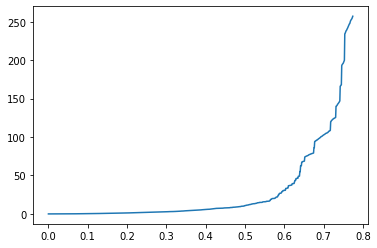

In [66]:
mDF['sweet_spot'] = (mDF['fn']+1)/( pow(mDF['fp'],1) + 1)
plt.plot(mDF['threshold'][:800], mDF['sweet_spot'][:800])
plt.show()

In [68]:
mDF.query('threshold >0.5 and threshold < 0.6')

,threshold,fp,fn,tn,tp,precision,recall,tpr,fpr,f1,roc_threshold,sweet_spot
516,0.500033,64.0,706.0,45407.0,3988.0,0.984205,0.849595,0.849595,0.001407,0.911960,0.924094,10.876923
517,0.501002,64.0,707.0,45407.0,3987.0,0.984201,0.849382,0.849382,0.001407,0.911835,0.923987,10.892308
518,0.501971,63.0,707.0,45408.0,3987.0,0.984444,0.849382,0.849382,0.001385,0.911940,0.923998,11.062500
519,0.502940,63.0,708.0,45408.0,3986.0,0.984441,0.849169,0.849169,0.001385,0.911815,0.923892,11.078125
520,0.503909,62.0,709.0,45409.0,3985.0,0.984680,0.848956,0.848956,0.001364,0.911795,0.923796,11.269841
...,...,...,...,...,...,...,...,...,...,...,...,...
615,0.595969,28.0,847.0,45443.0,3847.0,0.992774,0.819557,0.819557,0.000616,0.897888,0.909471,29.241379
616,0.596938,27.0,850.0,45444.0,3844.0,0.993025,0.818918,0.818918,0.000594,0.897607,0.909162,30.392857
617,0.597907,27.0,853.0,45444.0,3841.0,0.993020,0.818279,0.818279,0.000594,0.897220,0.908842,30.500000
618,0.598876,27.0,854.0,45444.0,3840.0,0.993018,0.818066,0.818066,0.000594,0.897091,0.908736,30.535714


In [81]:
threshold_fp = 0.7#to identify the real fp set it high
oof['predictions_bool_fp'] = oof['predictions'].apply(lambda x : 0 if x < threshold_fp else 1)  
oof['fp'] = oof.apply(lambda x: Metrics([x['targets']],
                                        [x['predictions_bool_fp']]).false_pos(), axis = 1) 
threshold_fn = 0.10 # to identify the real fn set it low
oof['predictions_bool_fn'] = oof['predictions'].apply(lambda x : 0 if x < threshold_fn else 1)  
oof['fn'] = oof.apply(lambda x: Metrics([x['targets']],
                                        [x['predictions_bool_fn']]).false_neg(), axis = 1)

In [82]:
oof.query('fp == 1')
oof.query('fn == 1')

,predictions,targets,target_ids,predictions_bool_fp,fp,predictions_bool_fn,fn
94,0.008424,1.0,50148,0,0,0,1
369,0.004089,1.0,30130,0,0,0,1
484,0.001202,1.0,3899,0,0,0,1
663,0.053121,1.0,34806,0,0,0,1
708,0.023520,1.0,10154,0,0,0,1
...,...,...,...,...,...,...,...
49459,0.002821,1.0,33475,0,0,0,1
49523,0.005283,1.0,39625,0,0,0,1
49546,0.023238,1.0,11763,0,0,0,1
49574,0.007003,1.0,8494,0,0,0,1


In [83]:
tr = pd.read_csv(f'{config.DATA_PATH}train_labels.csv')
trfp = tr[tr.index.isin(oof.query('fp == 1')['target_ids'].values.tolist())]
trfn = tr[tr.index.isin(oof.query('fn == 1')['target_ids'].values.tolist())]

In [84]:
# negative images classified as positive (fp)
print(trfp.head(), '\n\n', trfn.head())

                 id  target
4185   150be16760e4       0
4452   166375b9971e       0
13187  4348c01fe7ca       0
26652  8765570a6ff9       0
27045  89b70f06cab1       0 

                id  target
76   00667e94a985       1
85   0078157399c9       1
437  02616cd942c6       1
683  039c792fb361       1
865  0472c280fdd6       1


In [90]:
def disp_image(image_path, size = (8,6)):
    img = np.load(image_path)
#     print(img)
    plt.figure(figsize = size)
    plt.imshow(img)
    plt.show()

150be16760e4


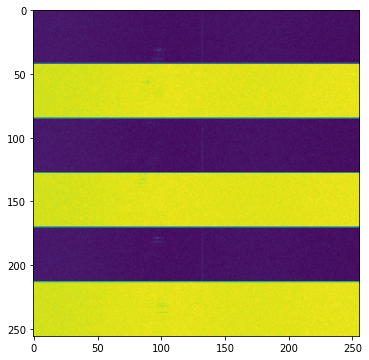

166375b9971e


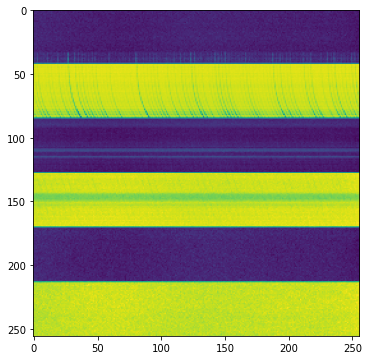

4348c01fe7ca


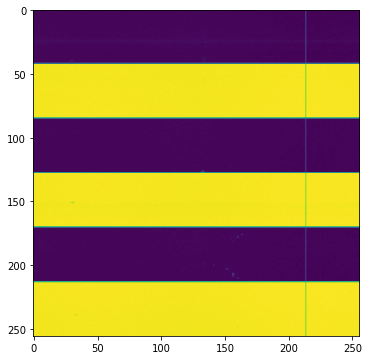

8765570a6ff9


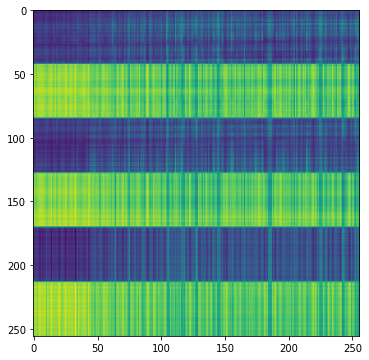

89b70f06cab1


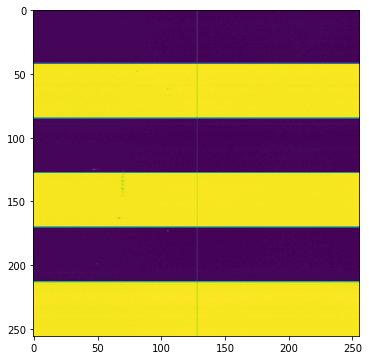

8c150cf9f1ad


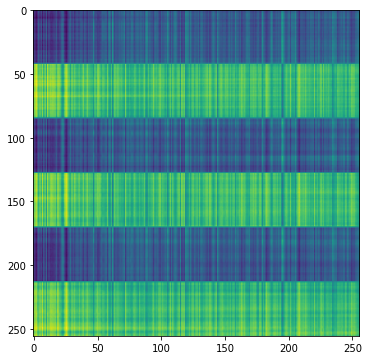

db6870e26f08


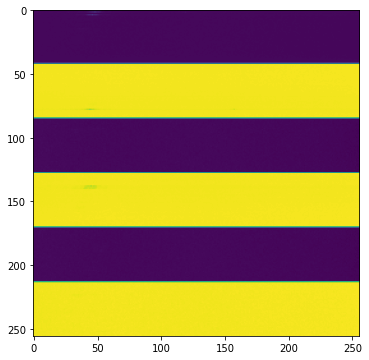

f2a570eb6145


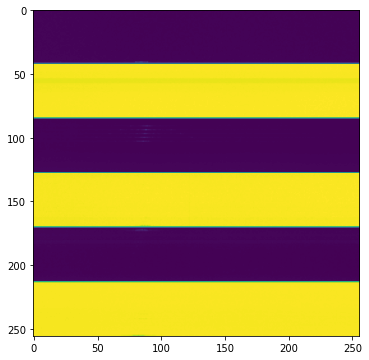

f5350e22a024


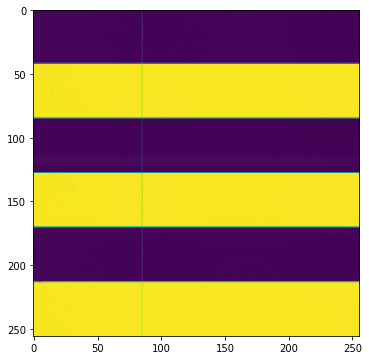

f672f073f522


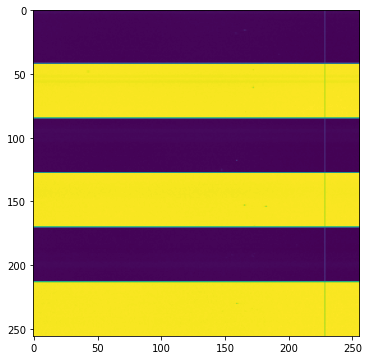

In [91]:
#images classified as positive but aren't
pos_imgs = trfp.id.values
for i in pos_imgs[:]:
    print(i)
    disp_image(f'{config.RESIZED_IMAGE_PATH}train/{i}.npy')

In [95]:
trfn.query('id == "00667e94a985"')

,id,target
76,00667e94a985,1


0 00667e94a985


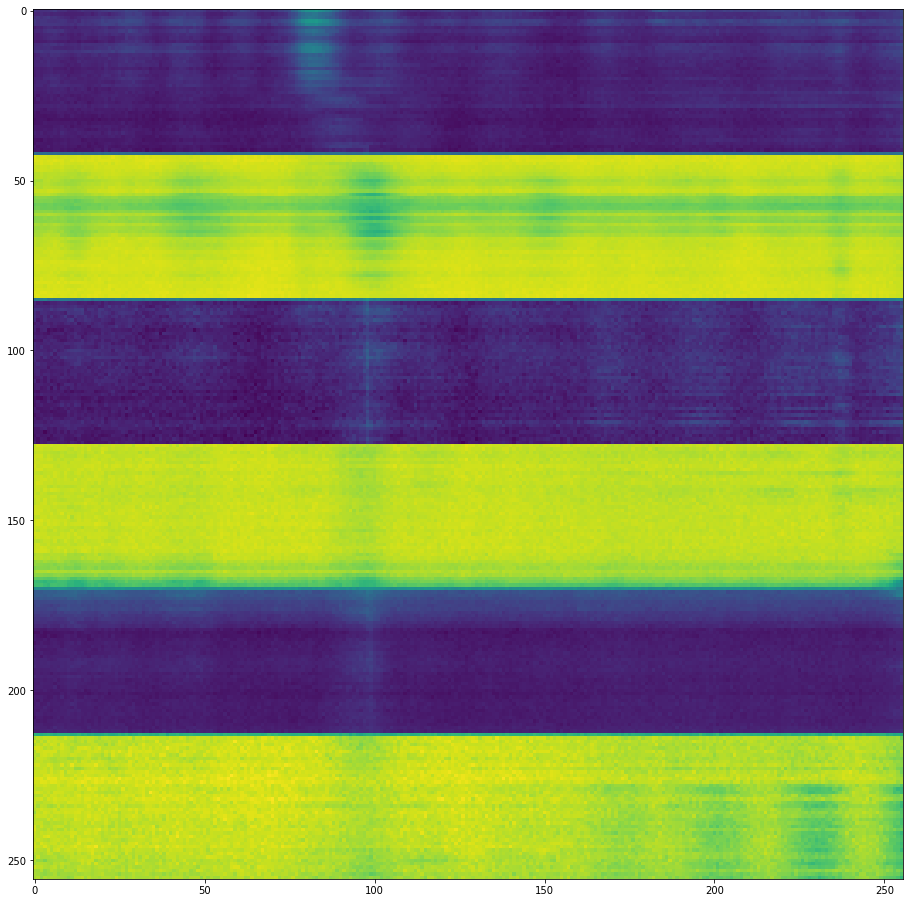

1 0078157399c9


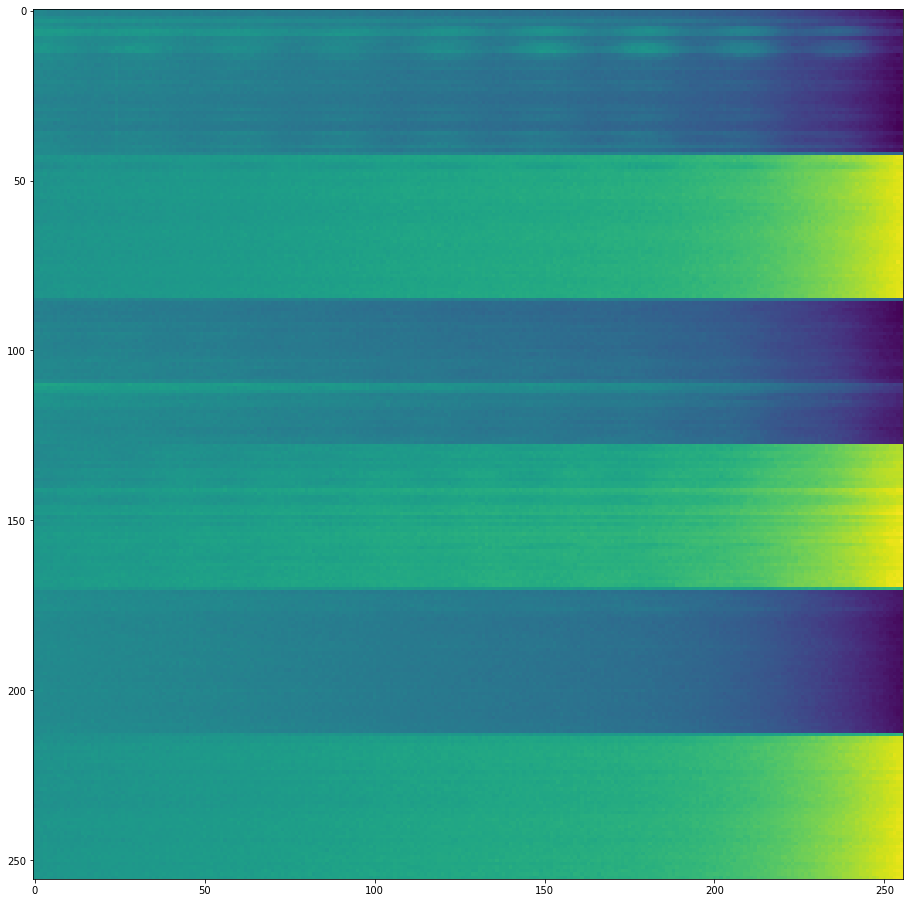

2 02616cd942c6


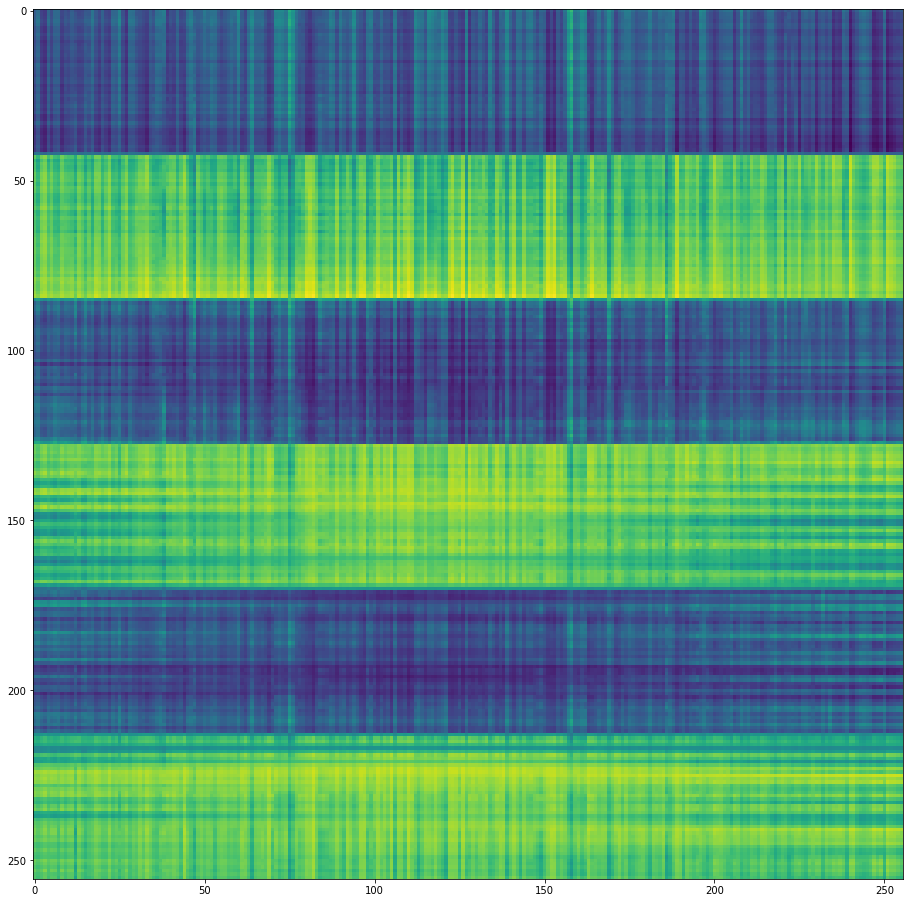

3 039c792fb361


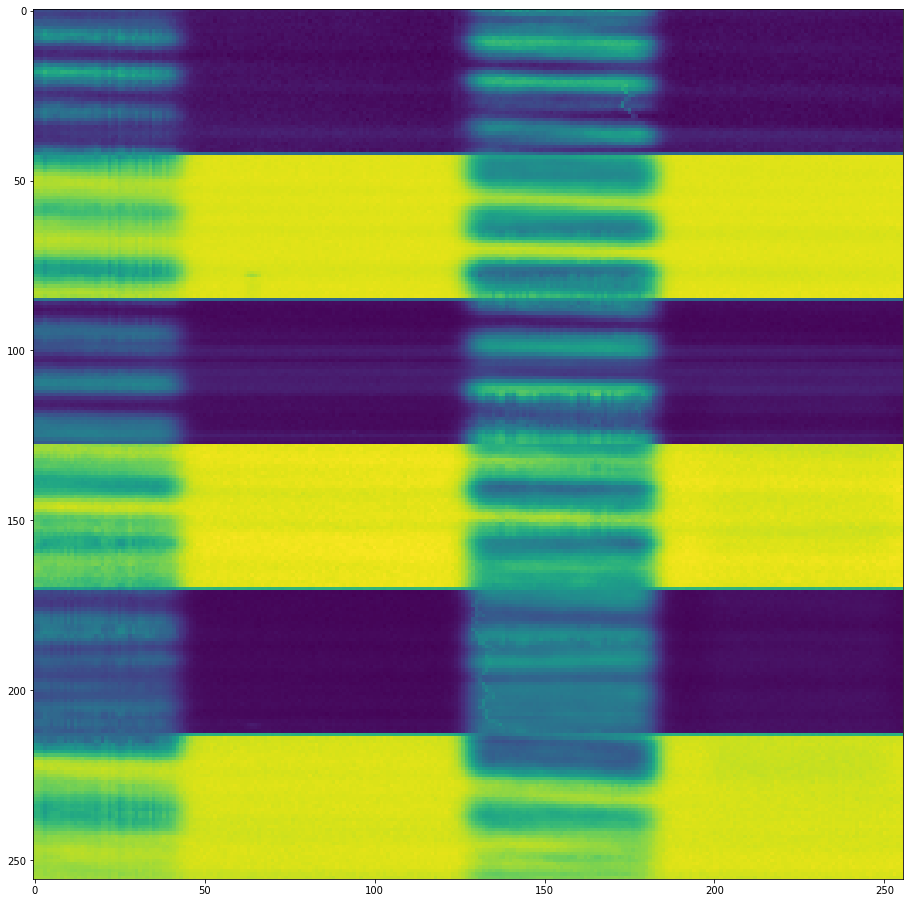

4 0472c280fdd6


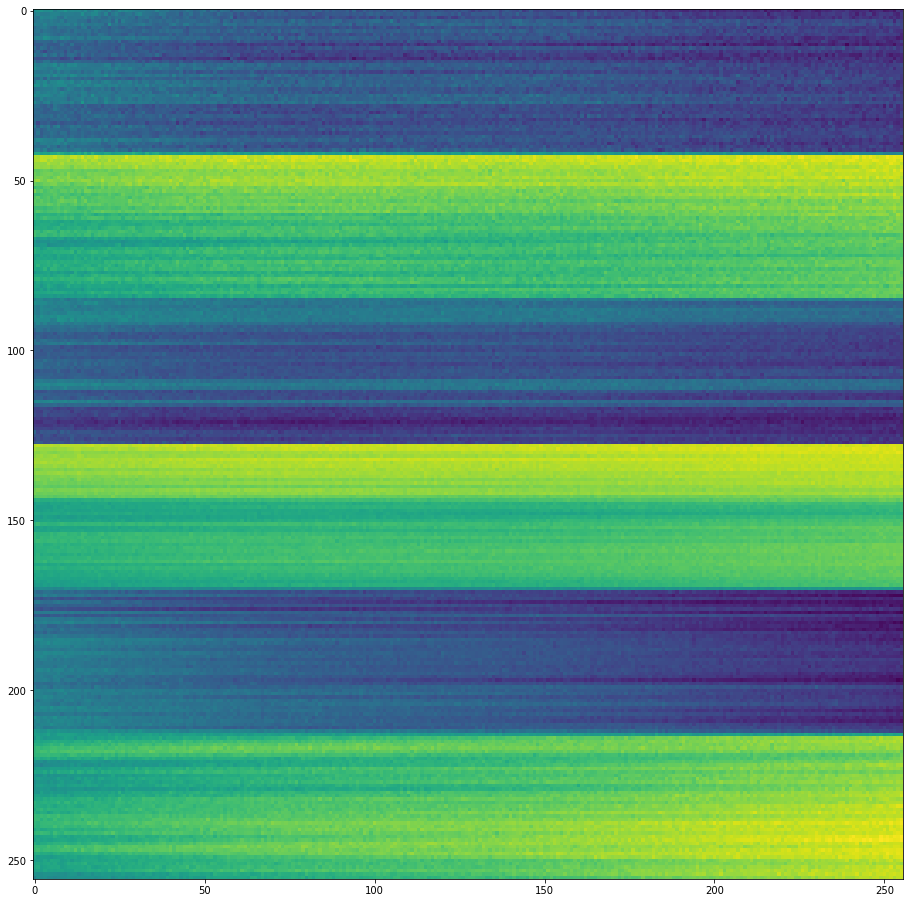

5 05fbd57da6de


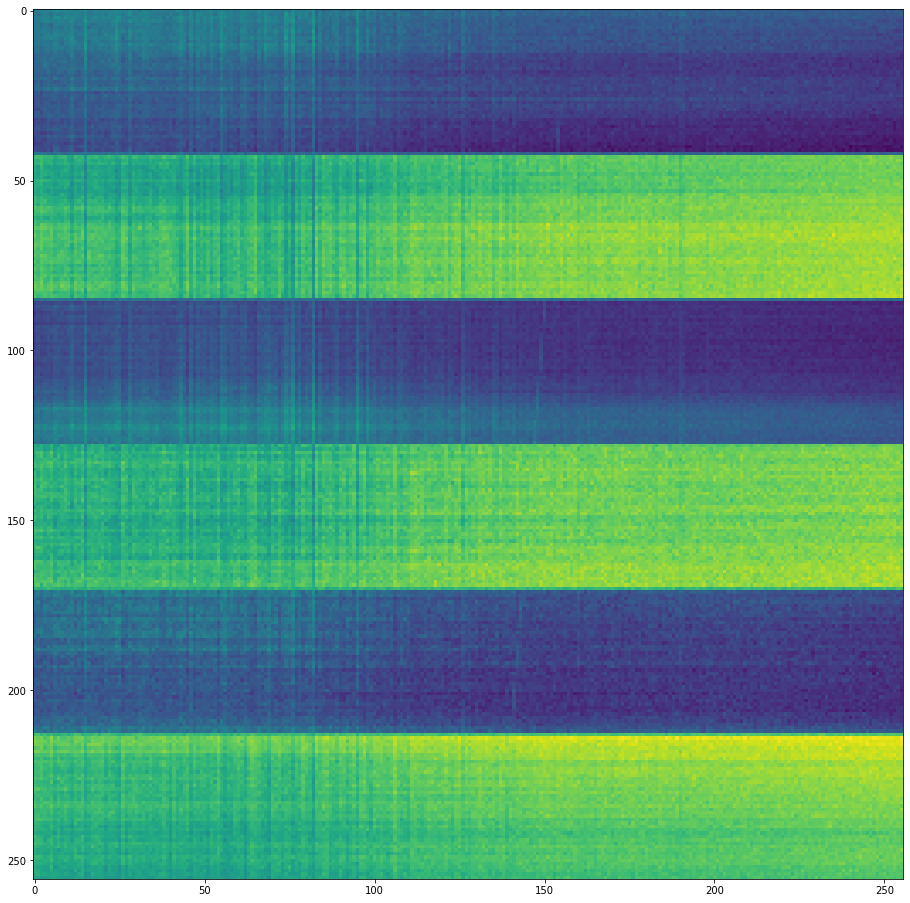

6 06103eae83a2


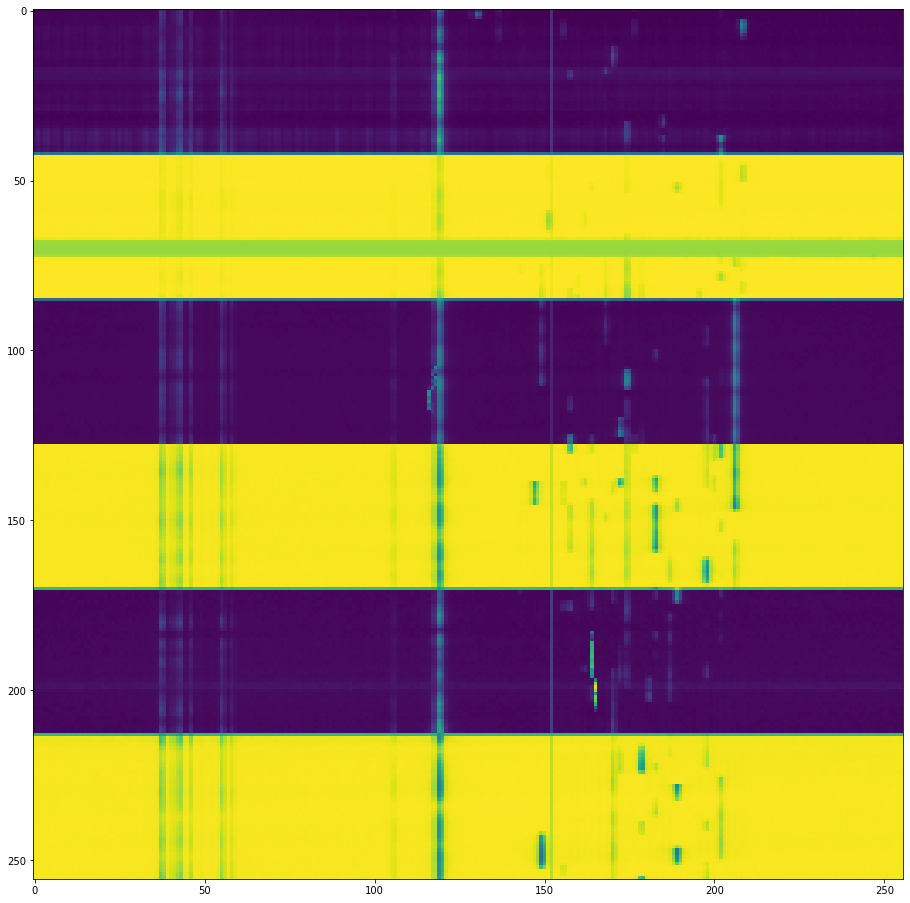

7 08015250a706


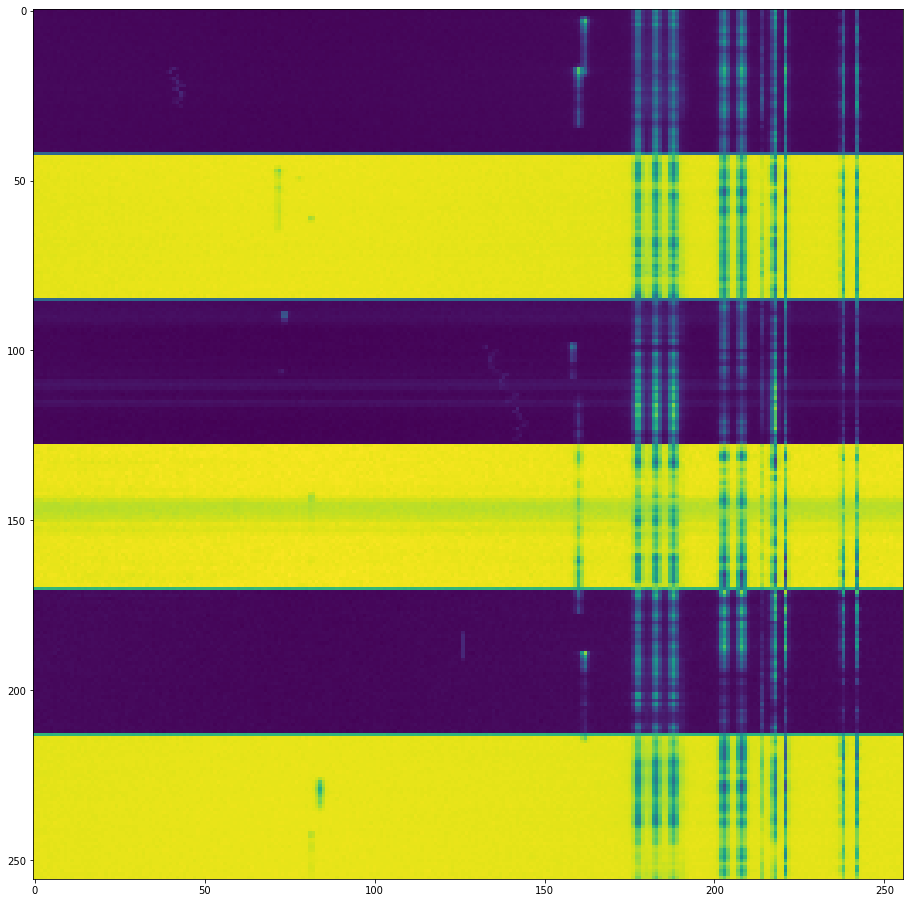

8 0842218f302a


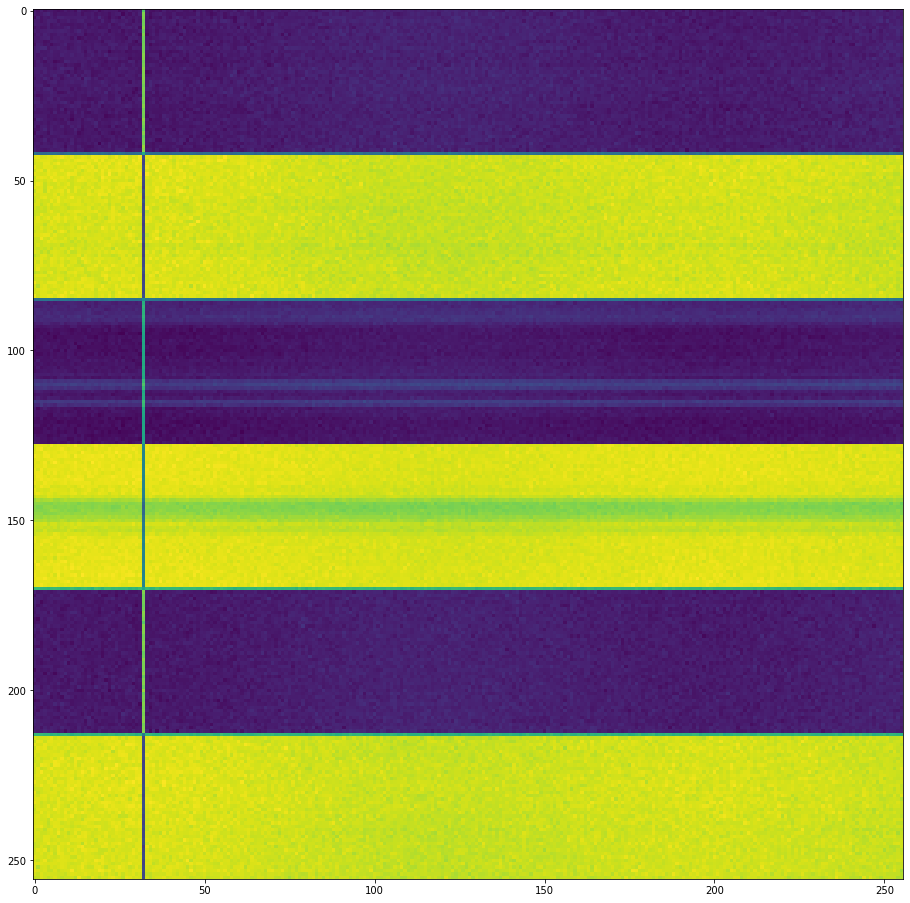

9 08651be54a4a


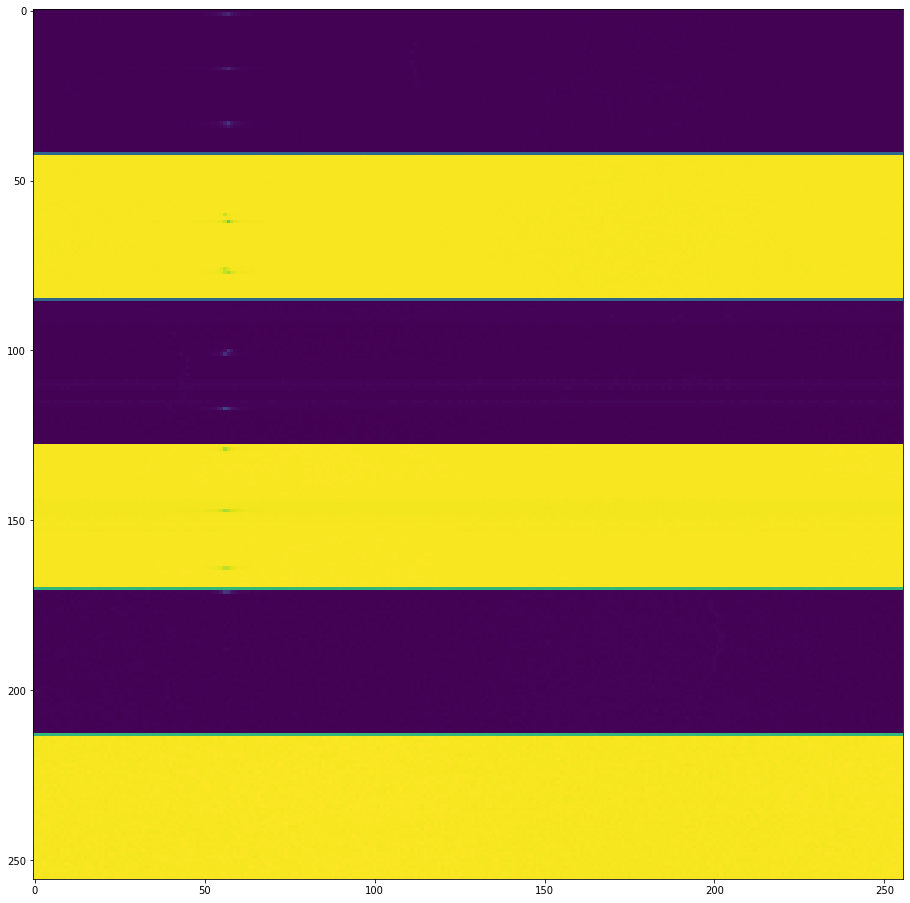

10 097057653f43


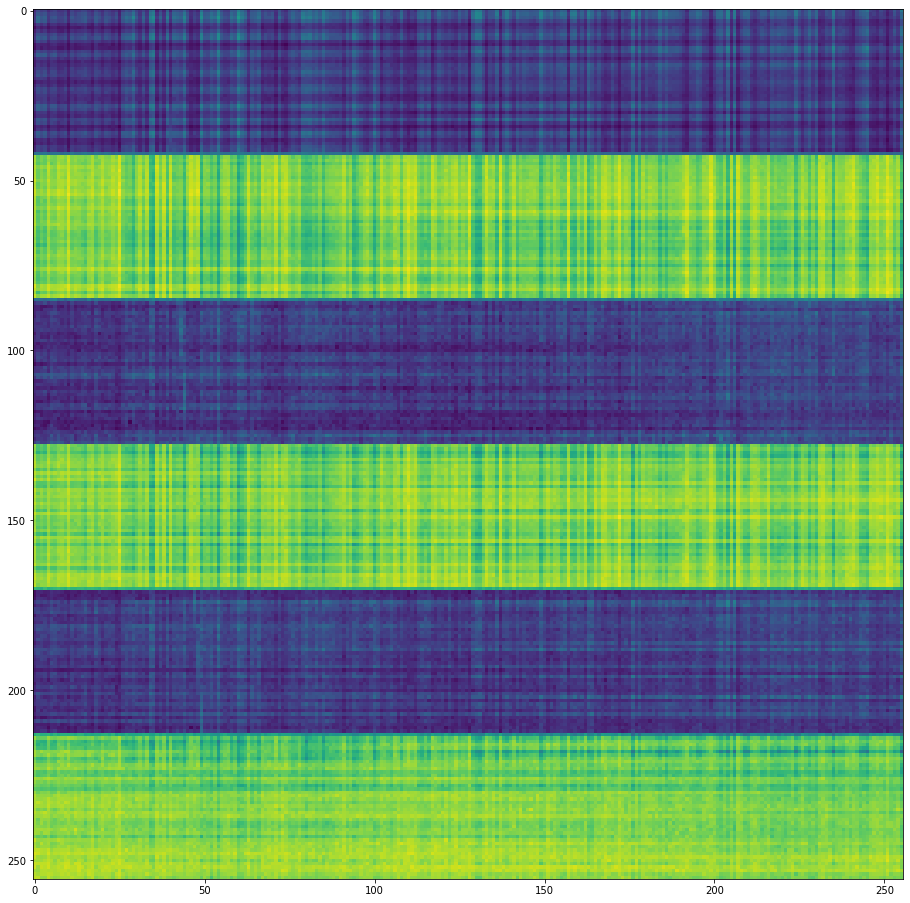

11 0b2b0069dd50


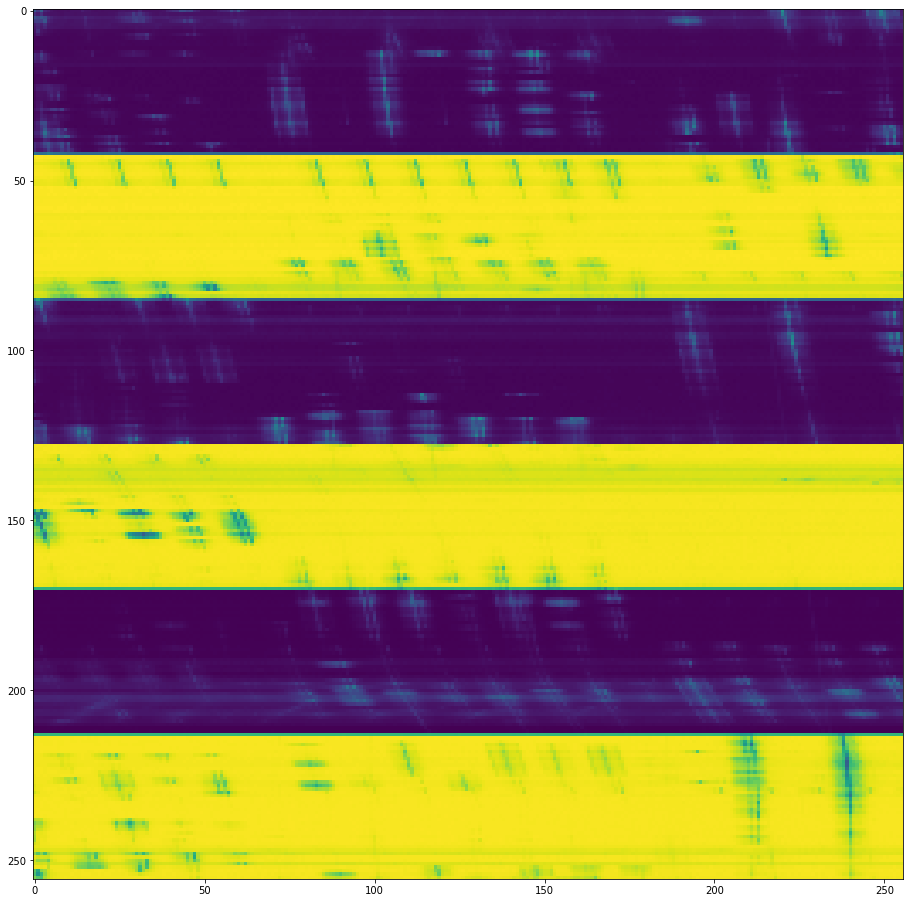

12 0c40d55c1481


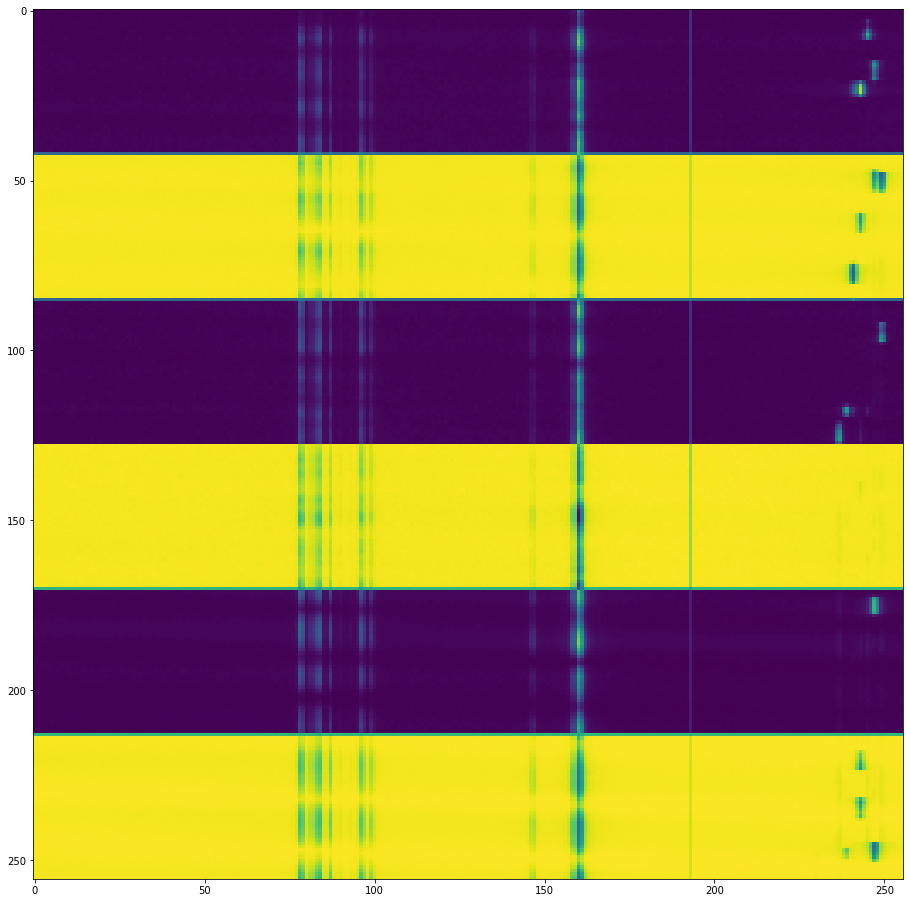

13 0c7e18de2e3d


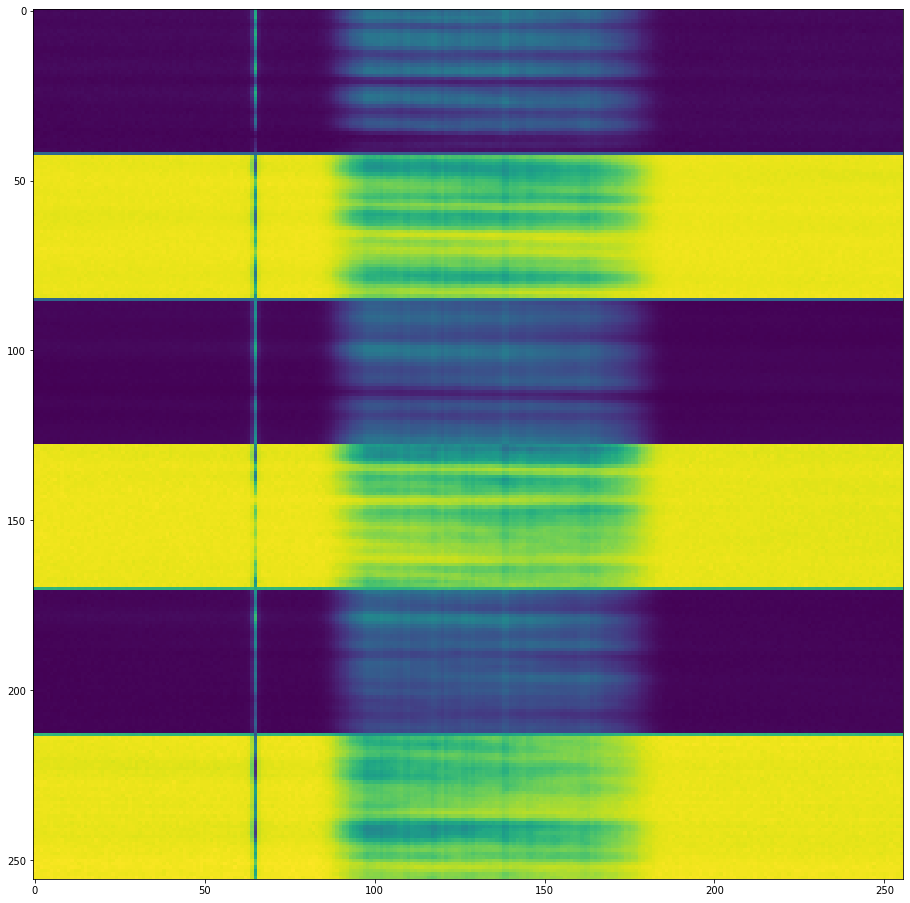

14 0cc4c8dafa69


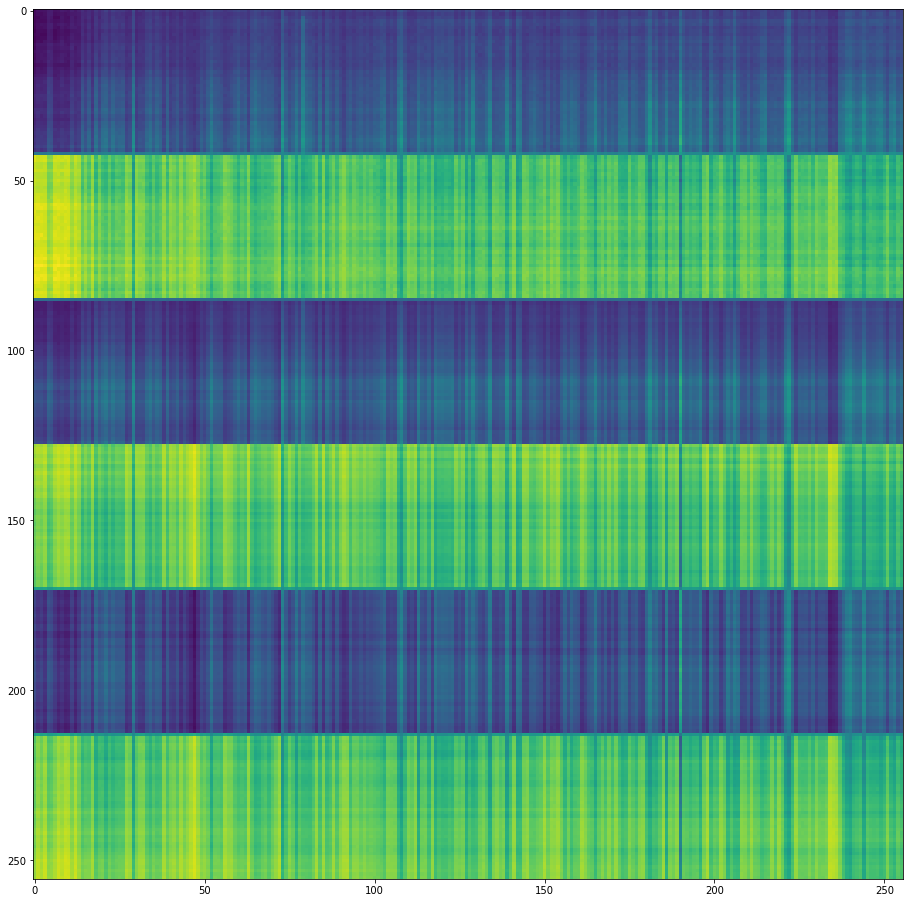

15 0cf56de58312


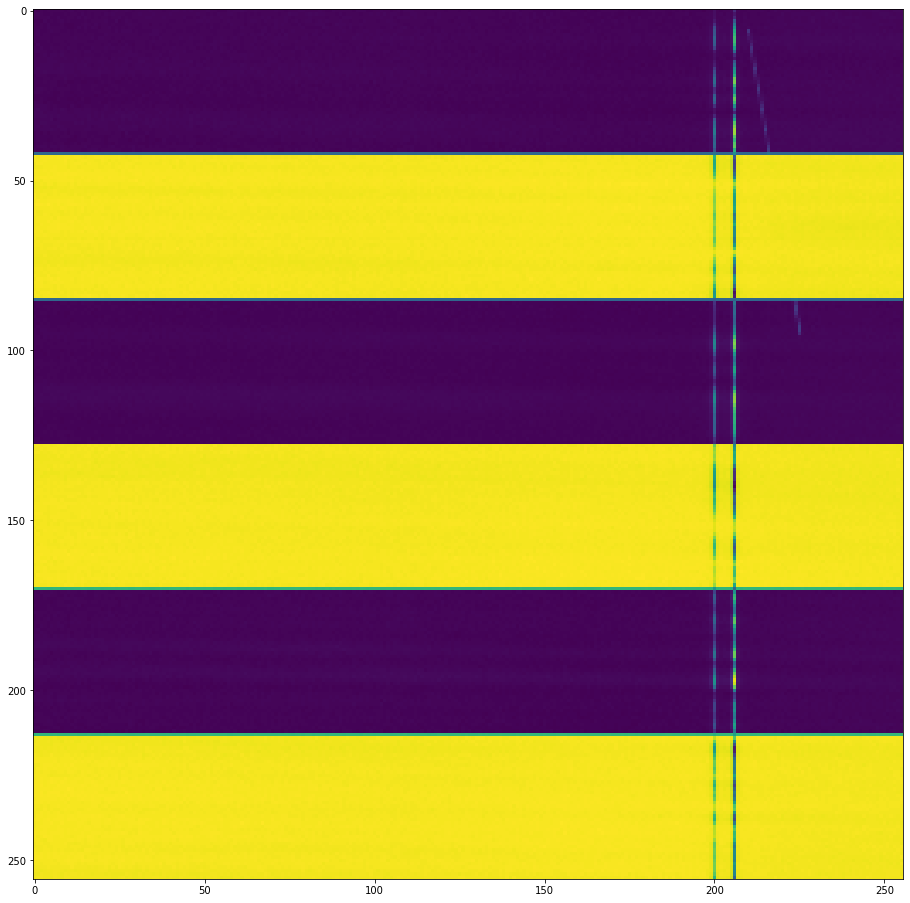

16 0fe36ac6ff5a


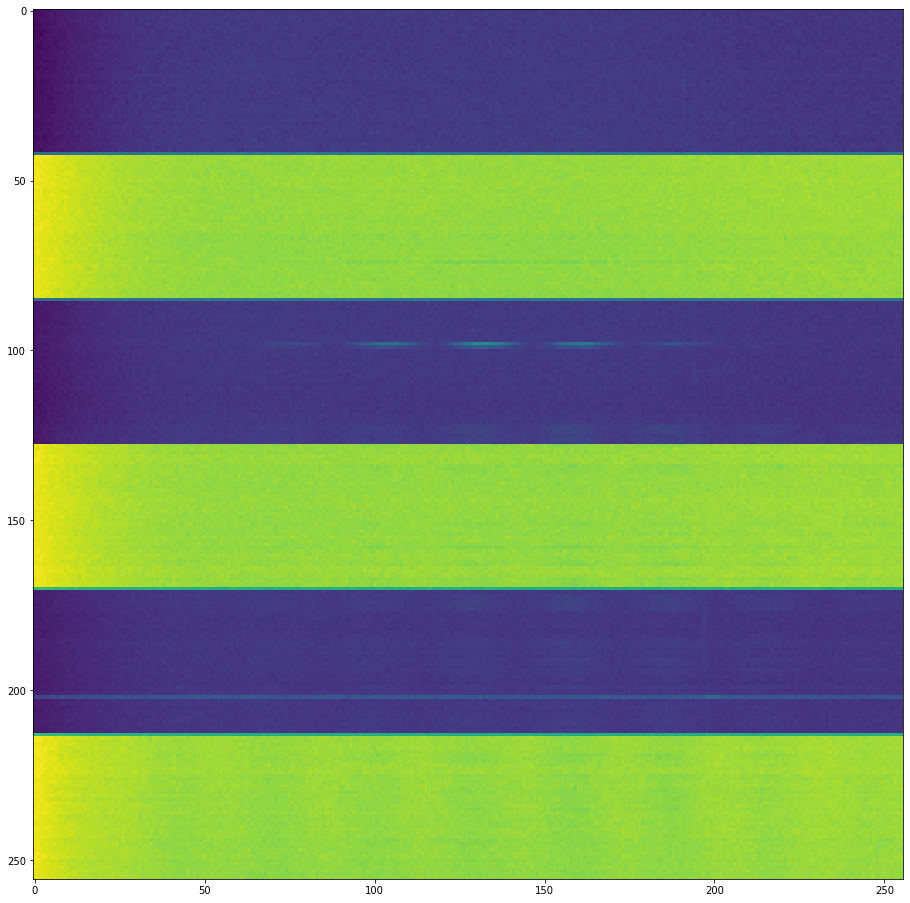

17 1013ec7cce13


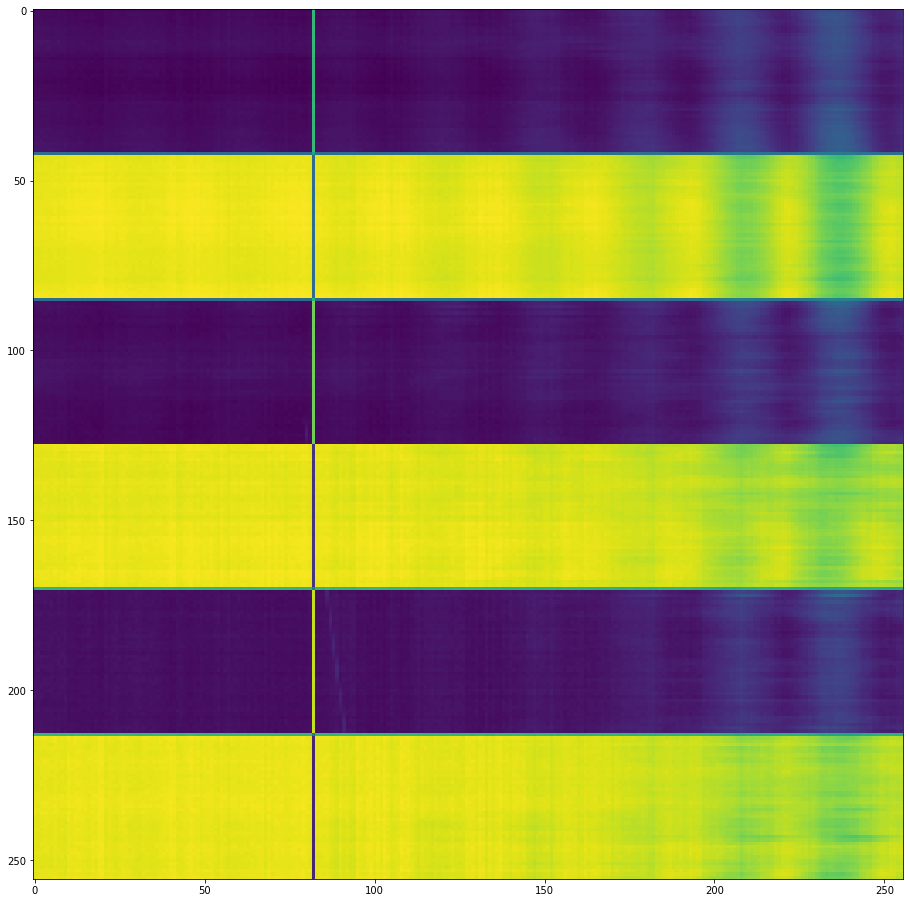

18 1054725b3ac9


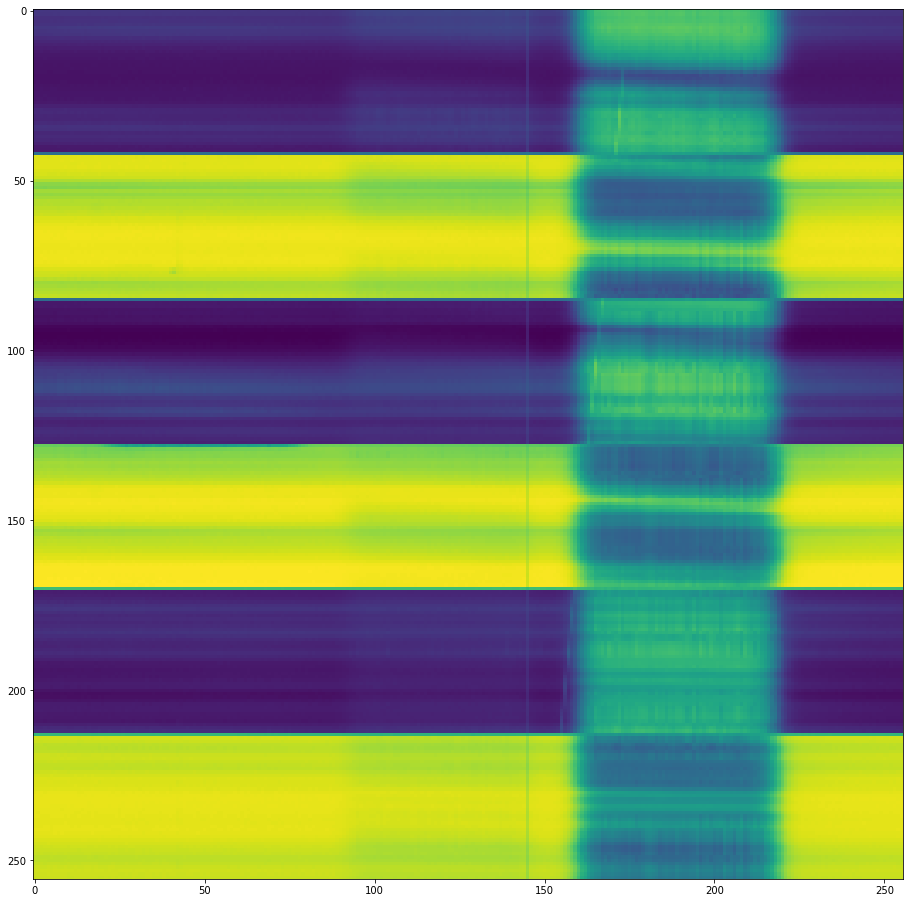

19 10d425c3301e


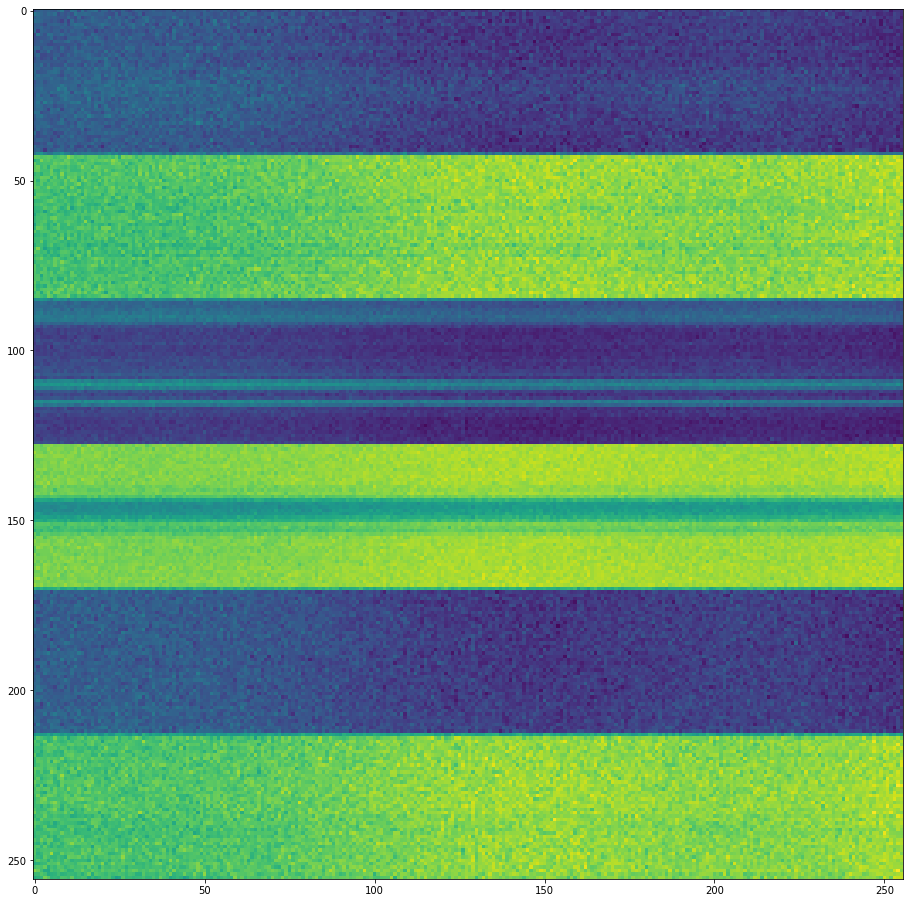

20 127ce0738978


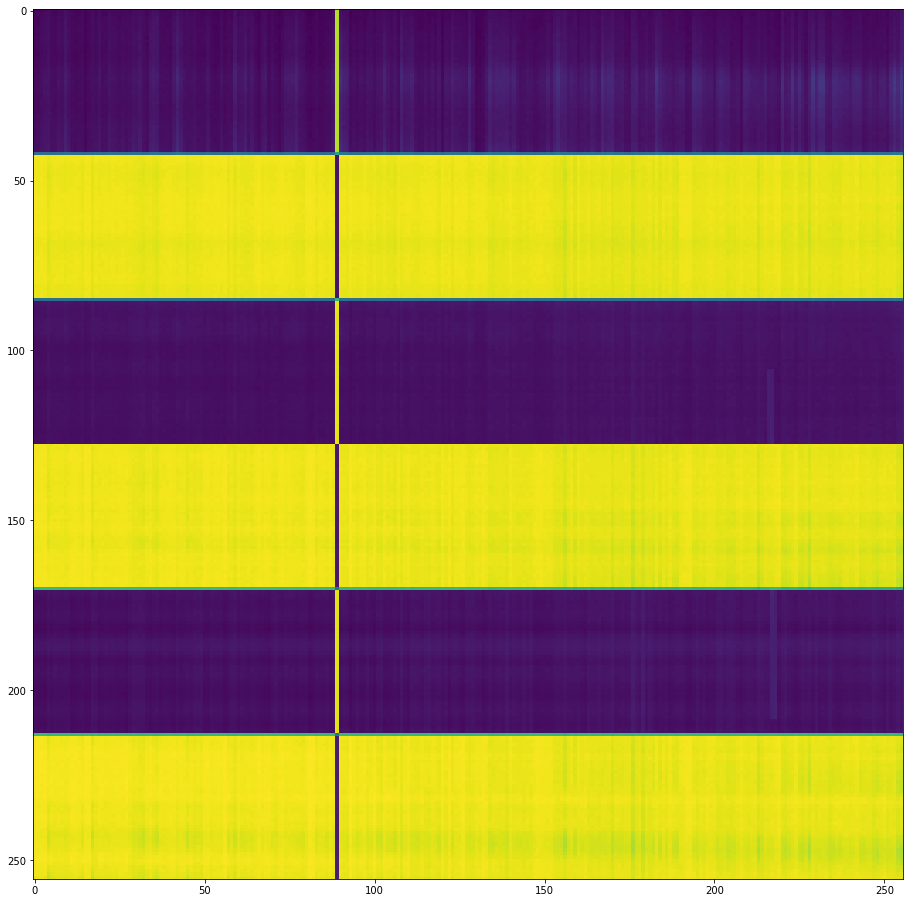

21 128665de9e88


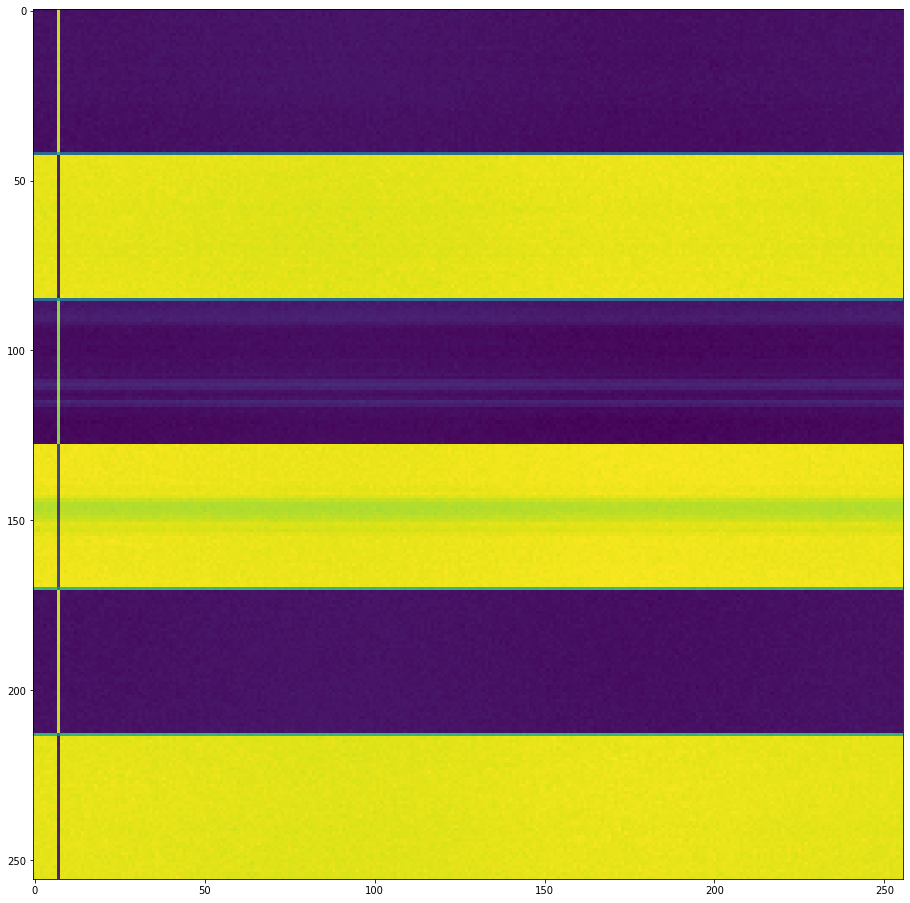

22 13b561c0ab53


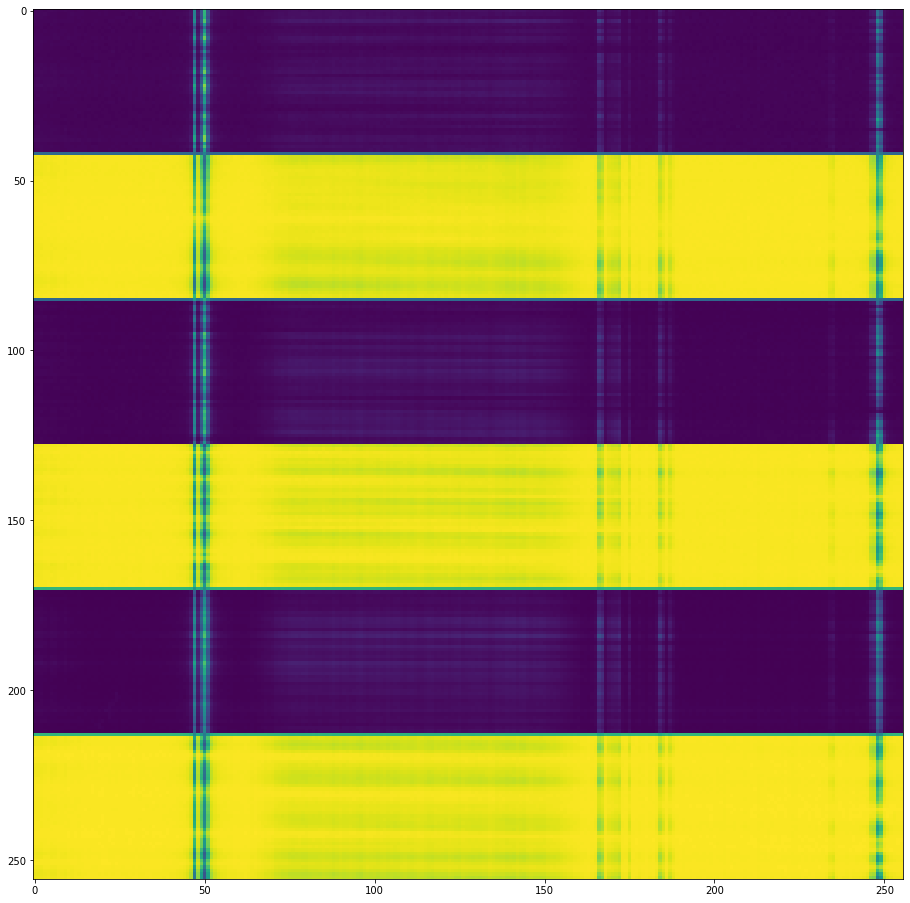

23 14000ab77587


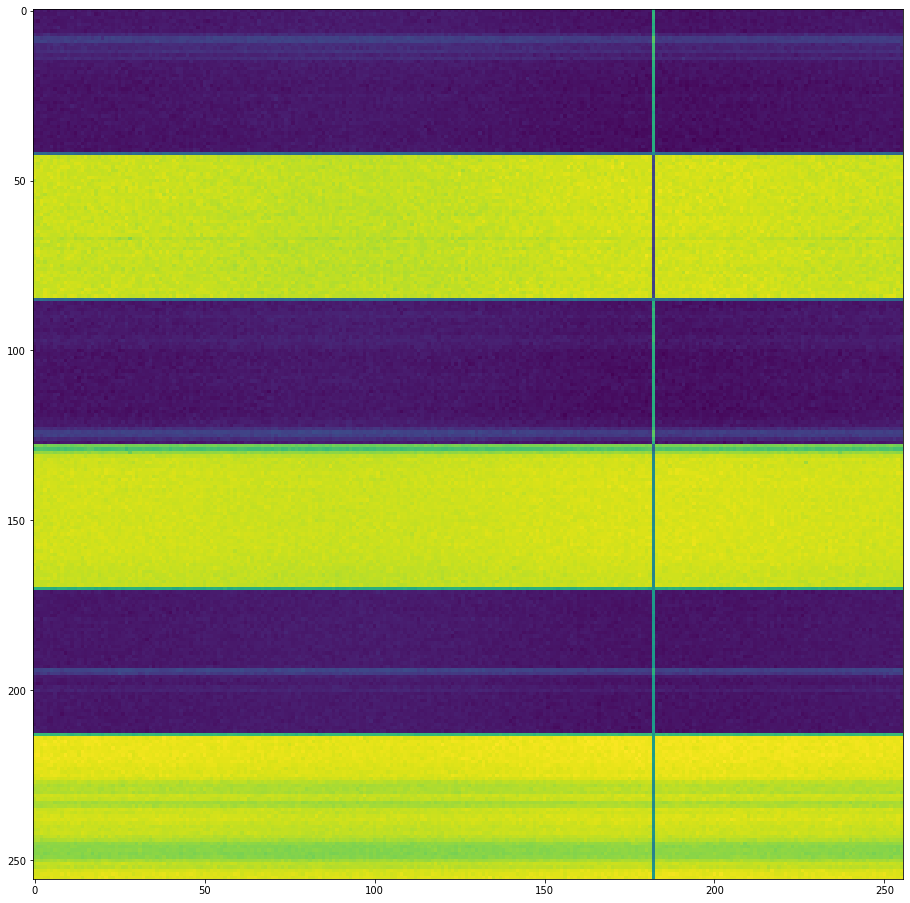

24 14308f15f730


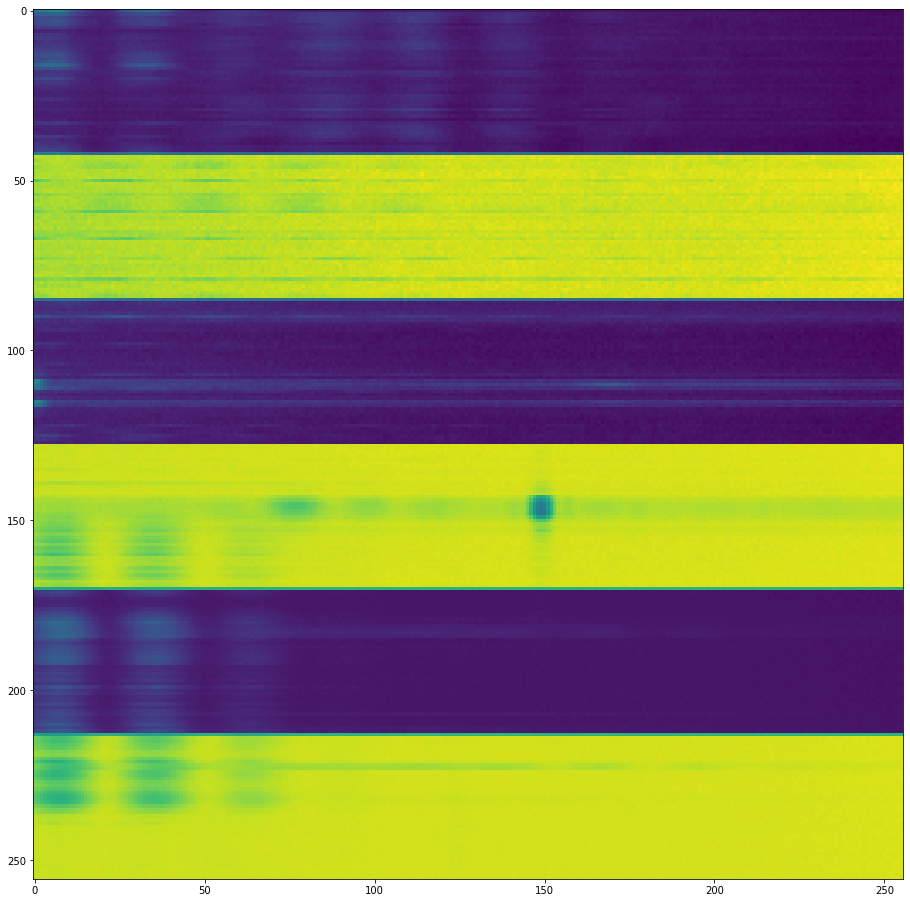

25 143f96db0db9


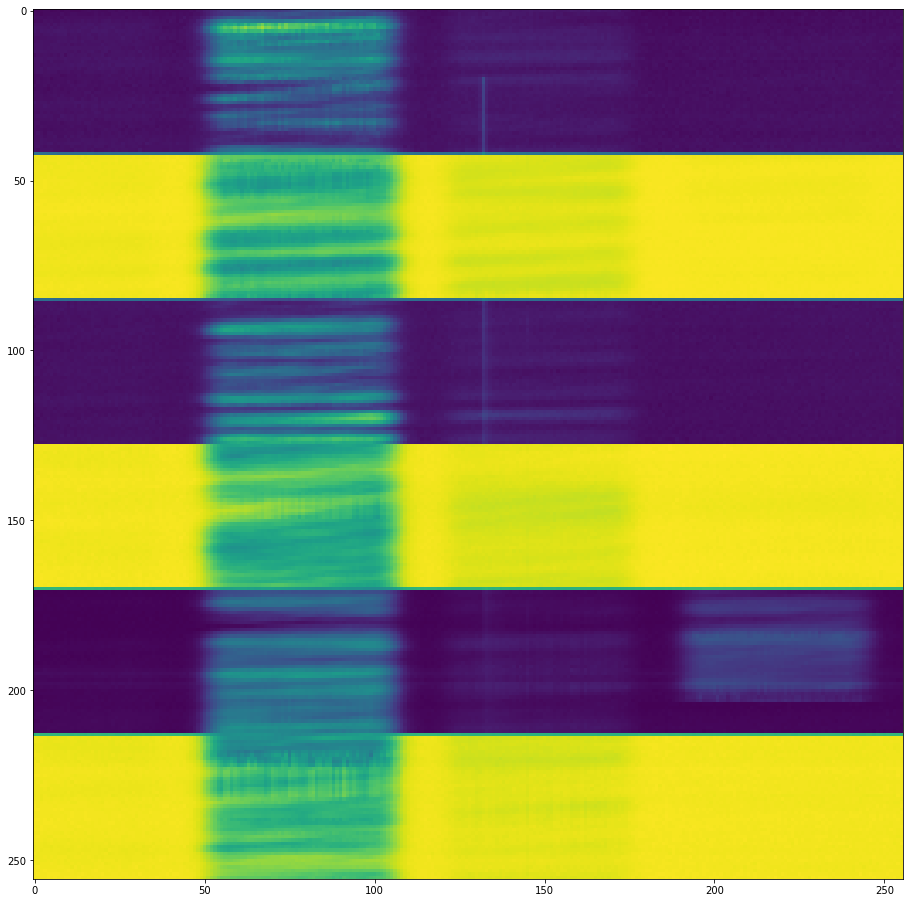

26 1462fb566eb8


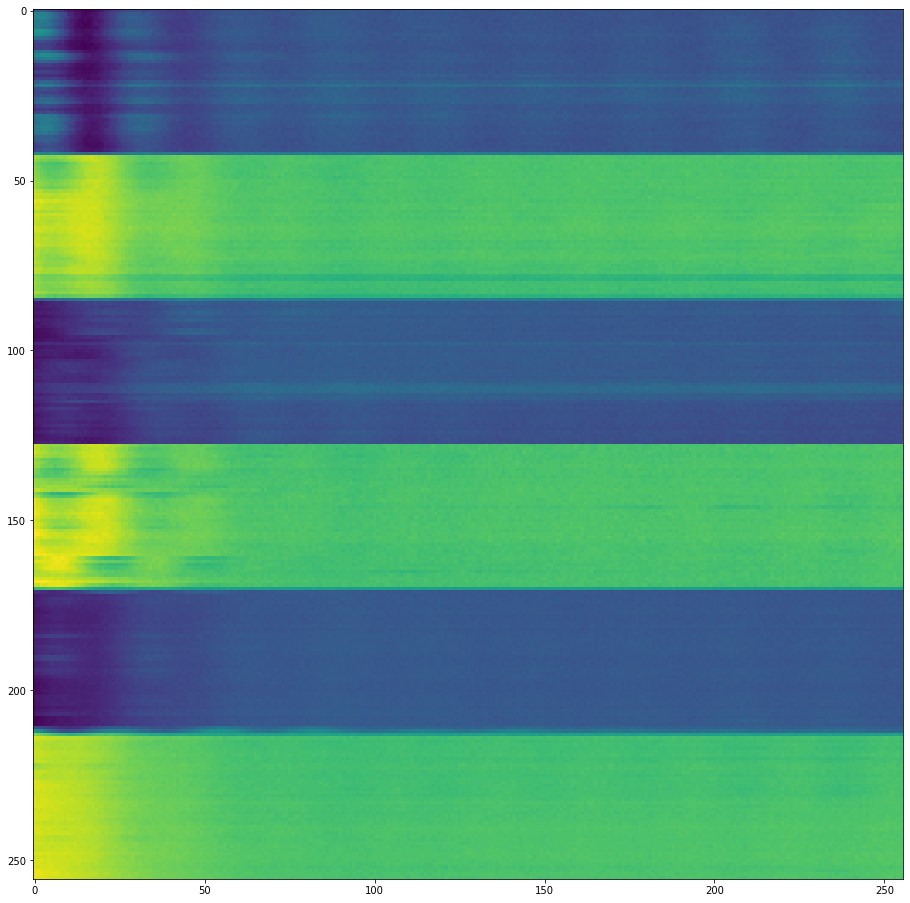

27 15364726f0fe


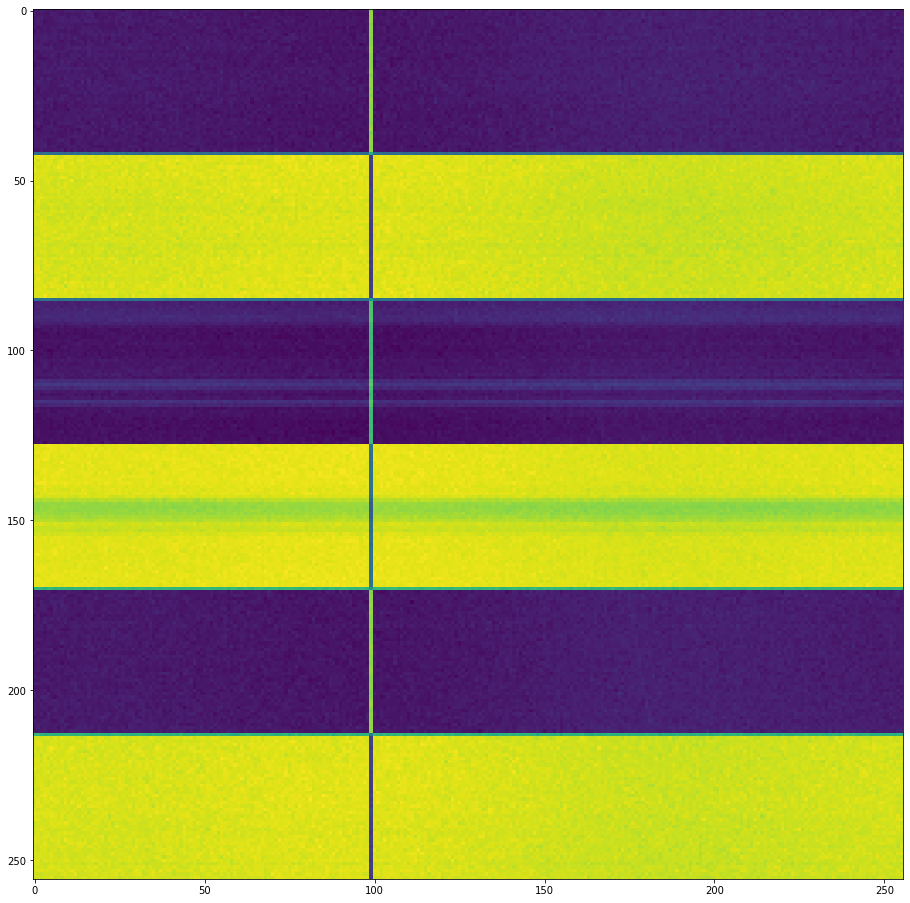

28 153ed9a95bdd


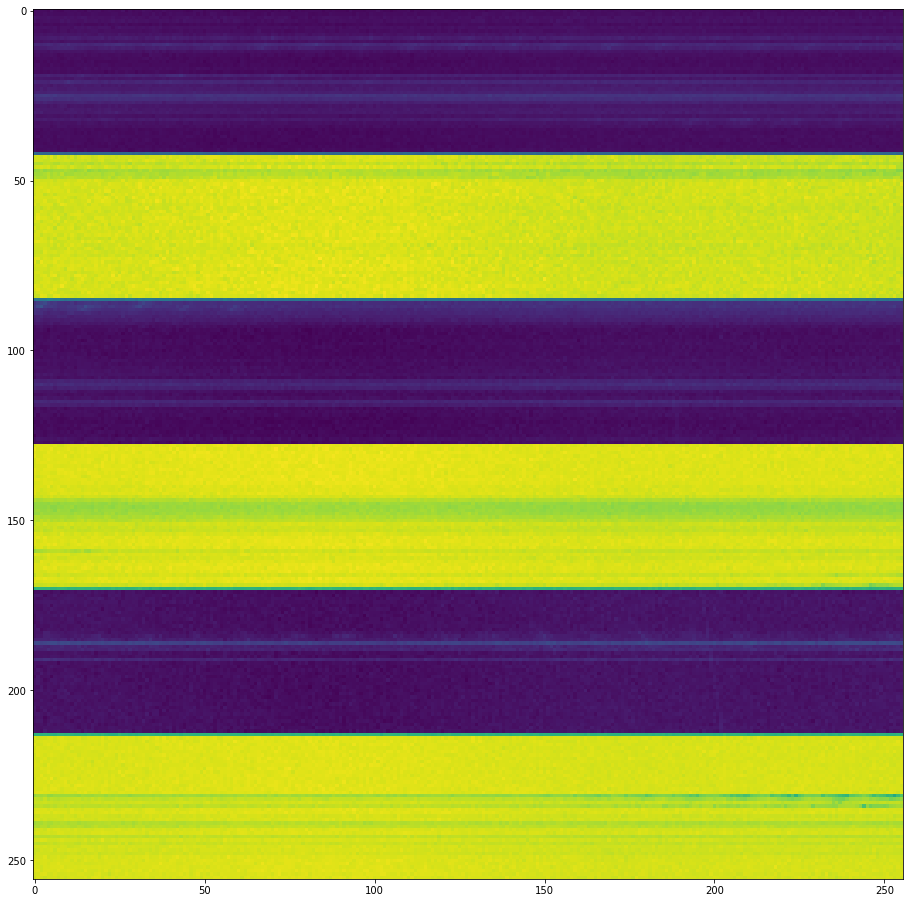

29 1550a2706872


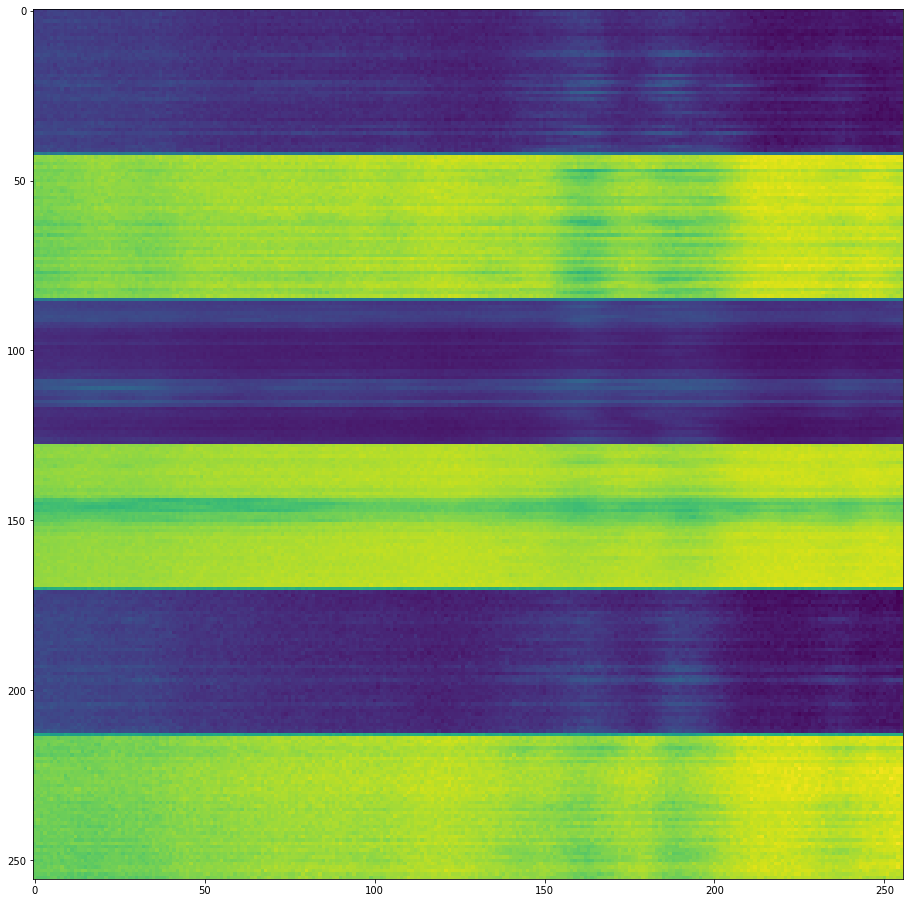

30 15c228a310a9


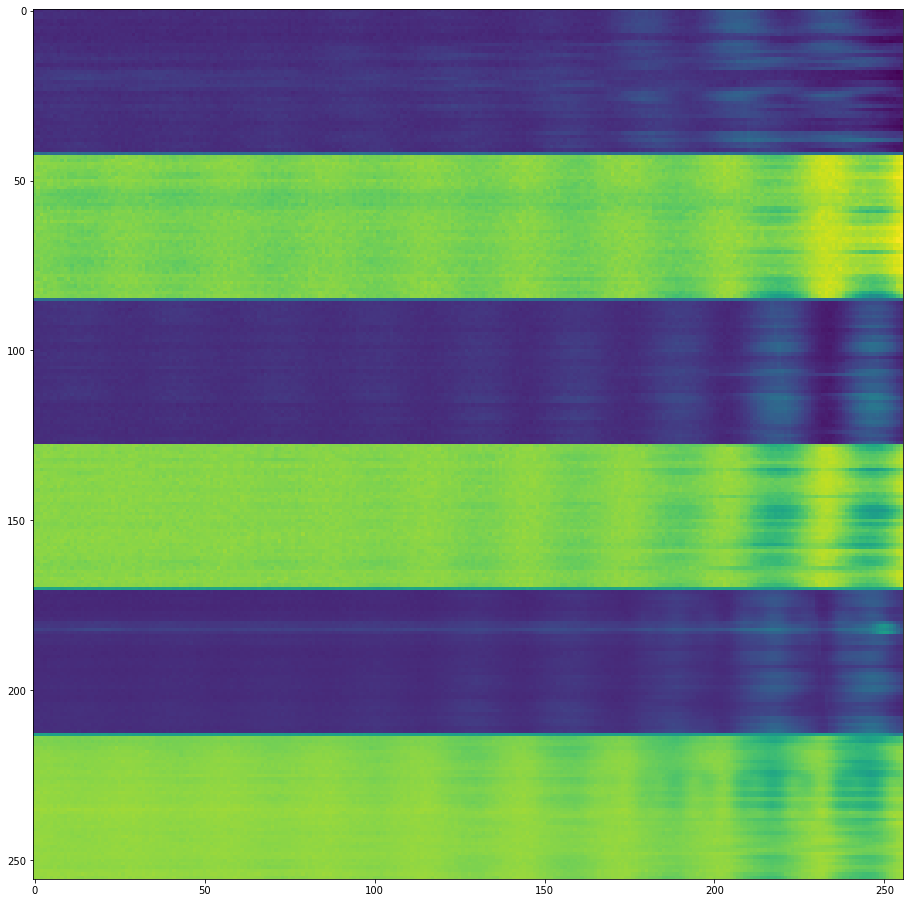

31 163977286841


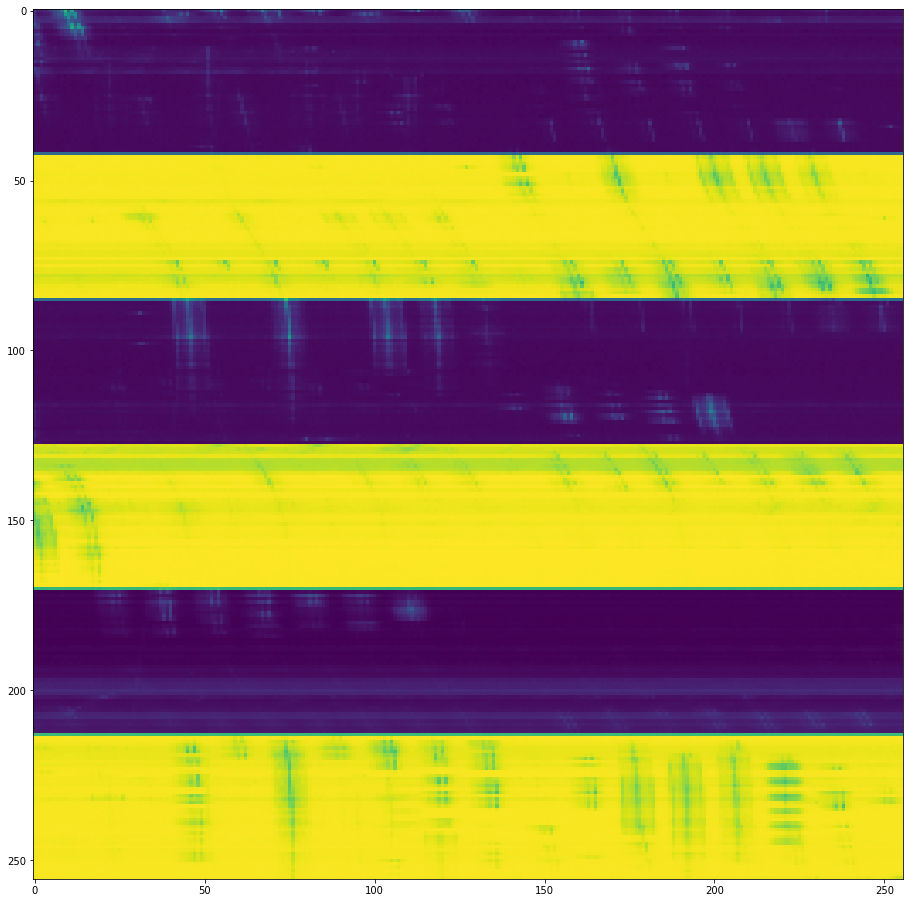

32 1645a33d40a2


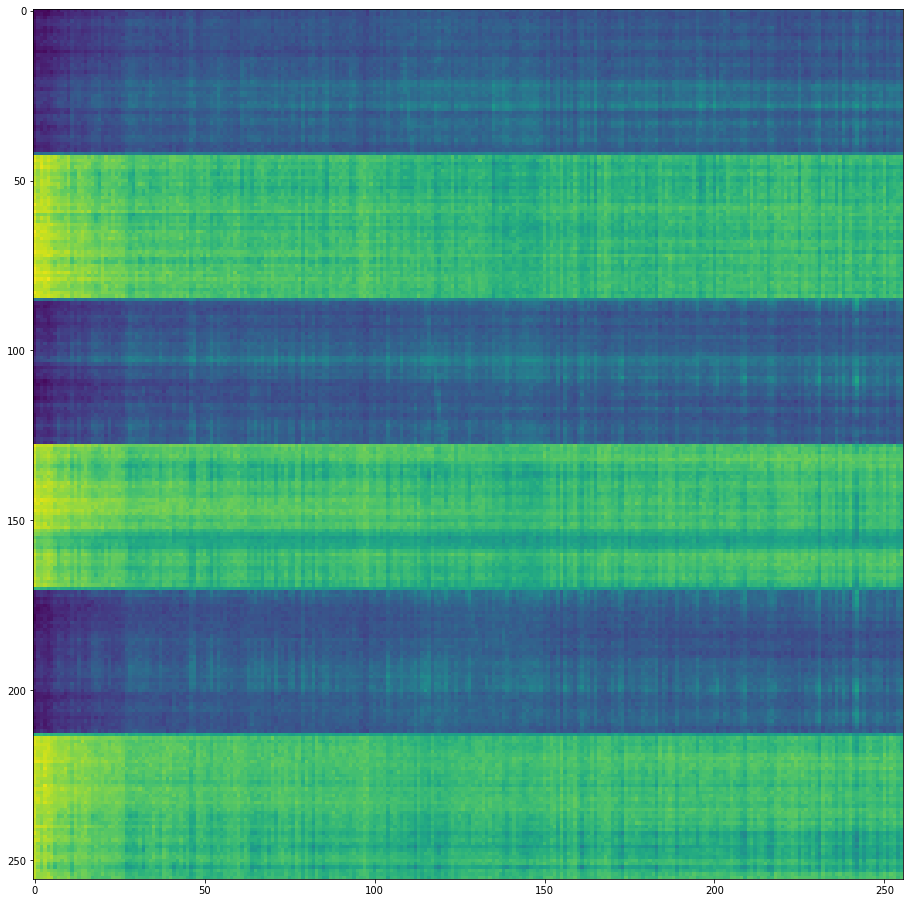

33 17a7c5217942


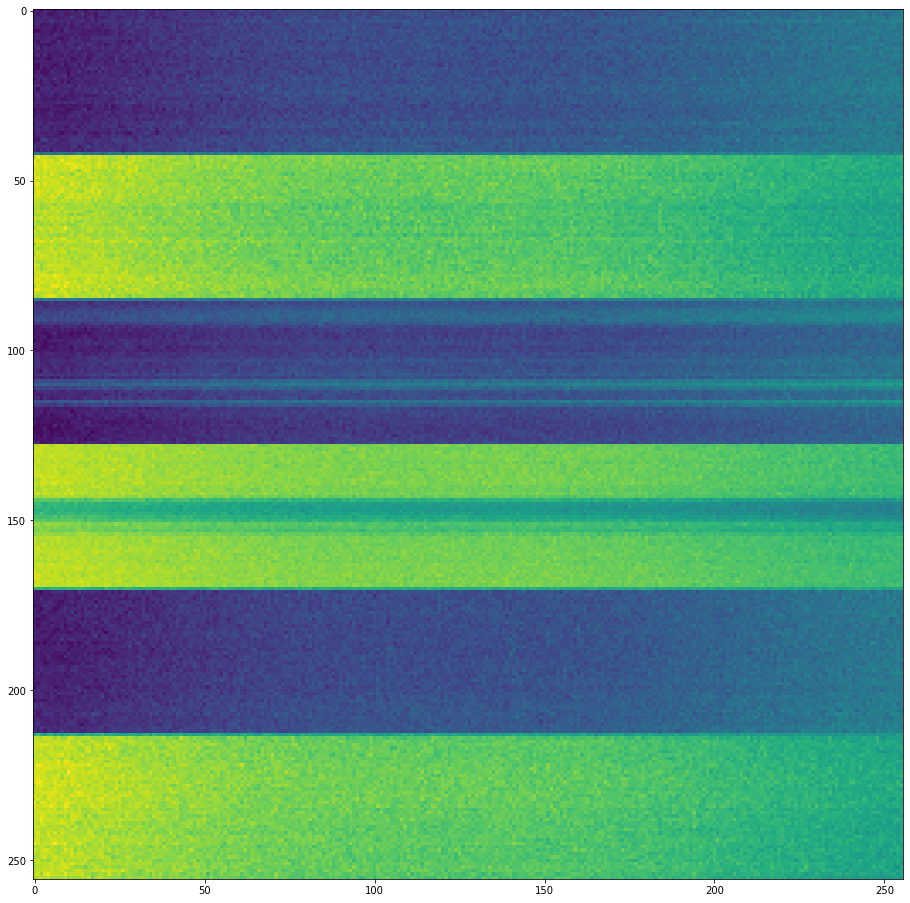

34 17b1f3c4e6f2


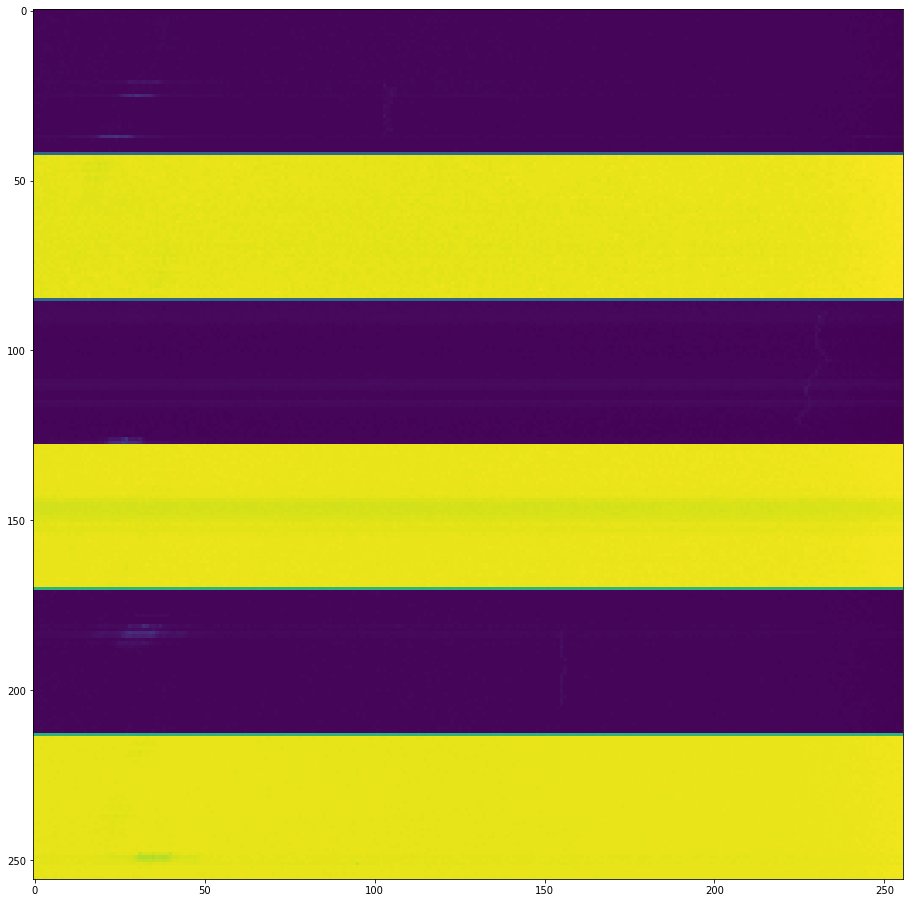

35 17e564a59280


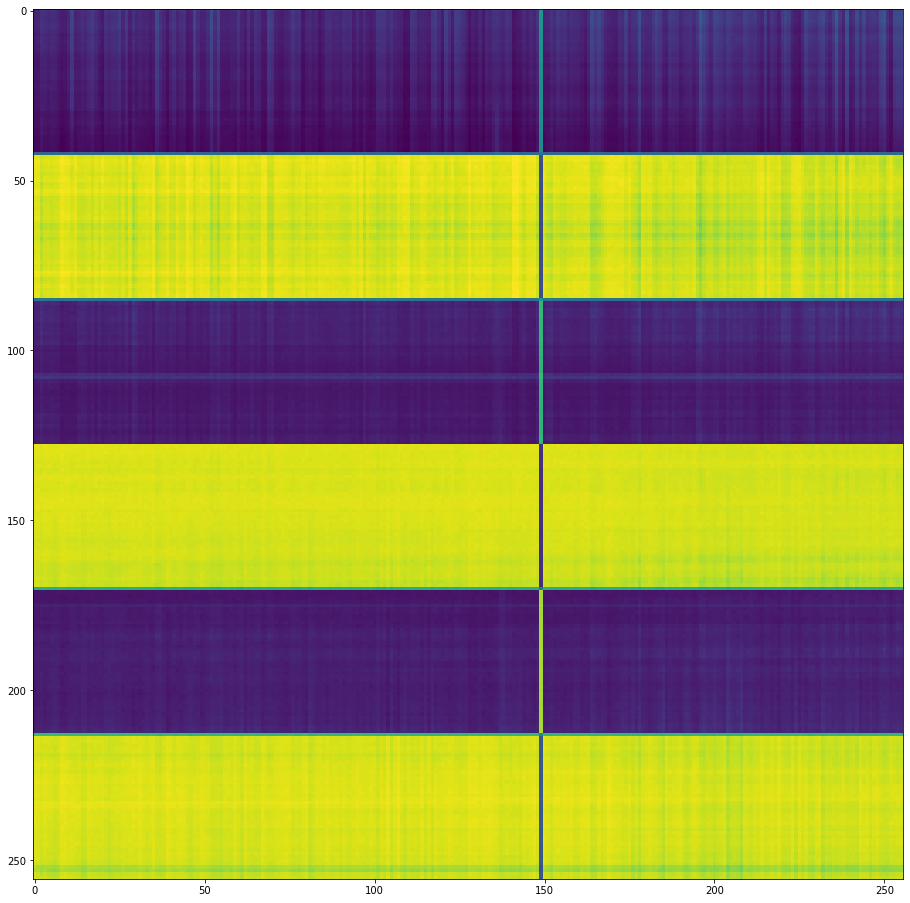

36 18adcf9035f7


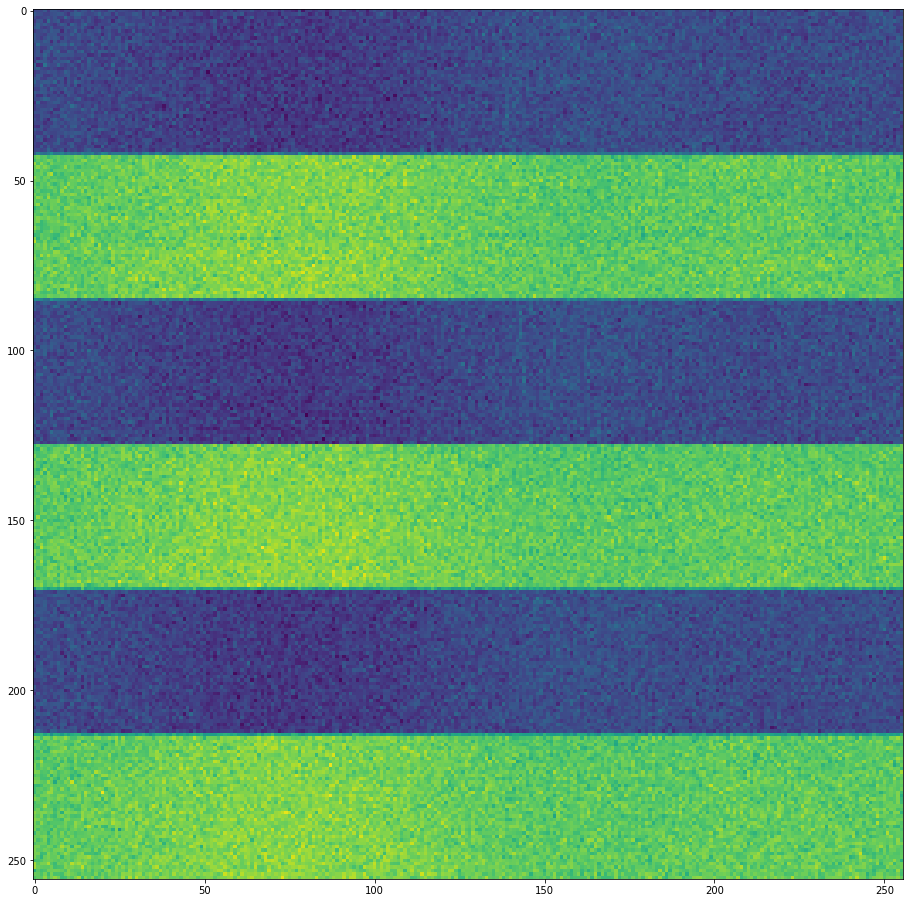

37 1937ace06de2


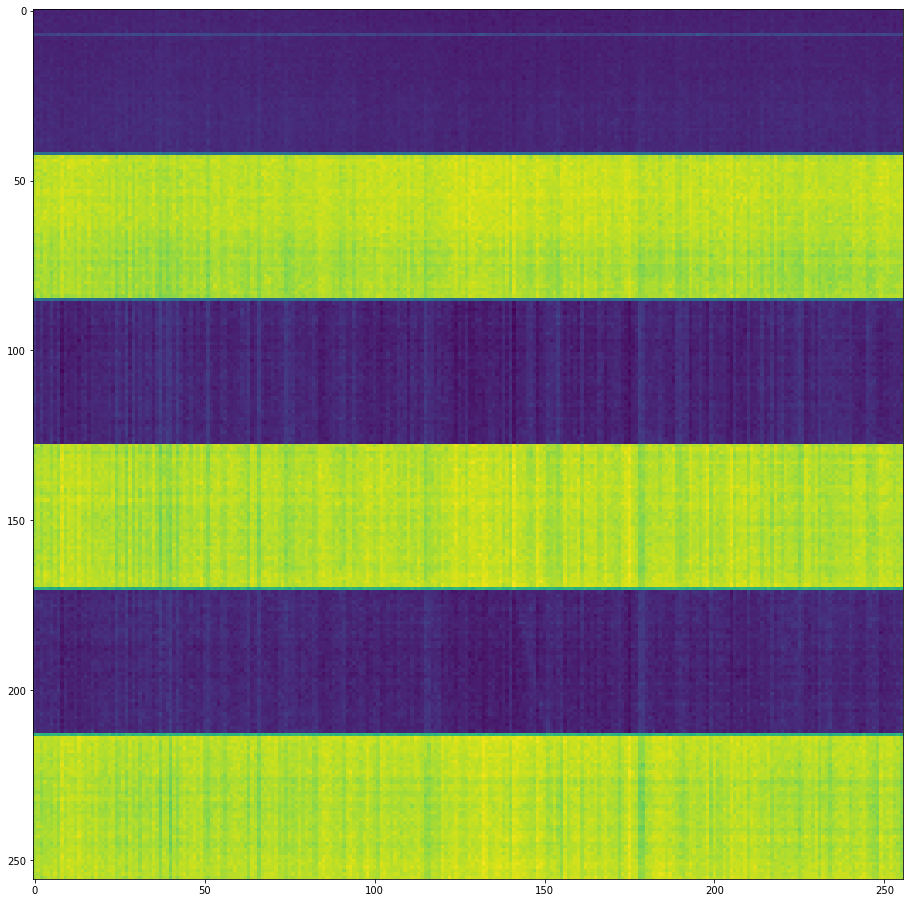

38 1a14c57e8f24


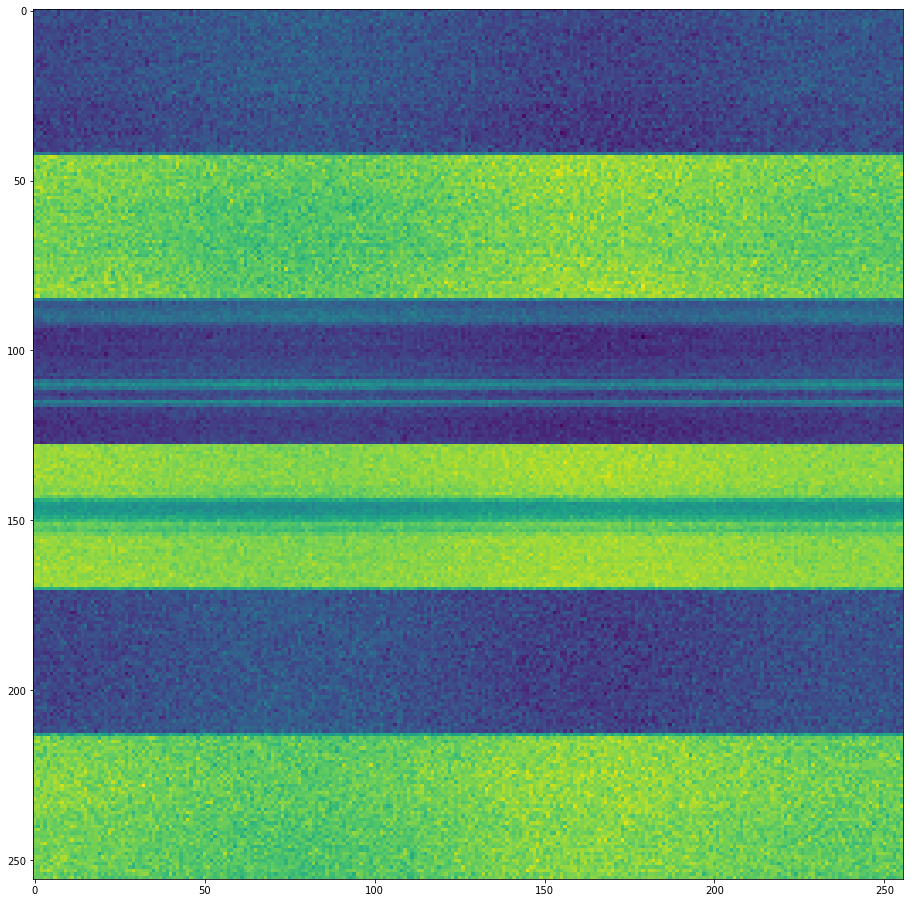

39 1a6ea827da87


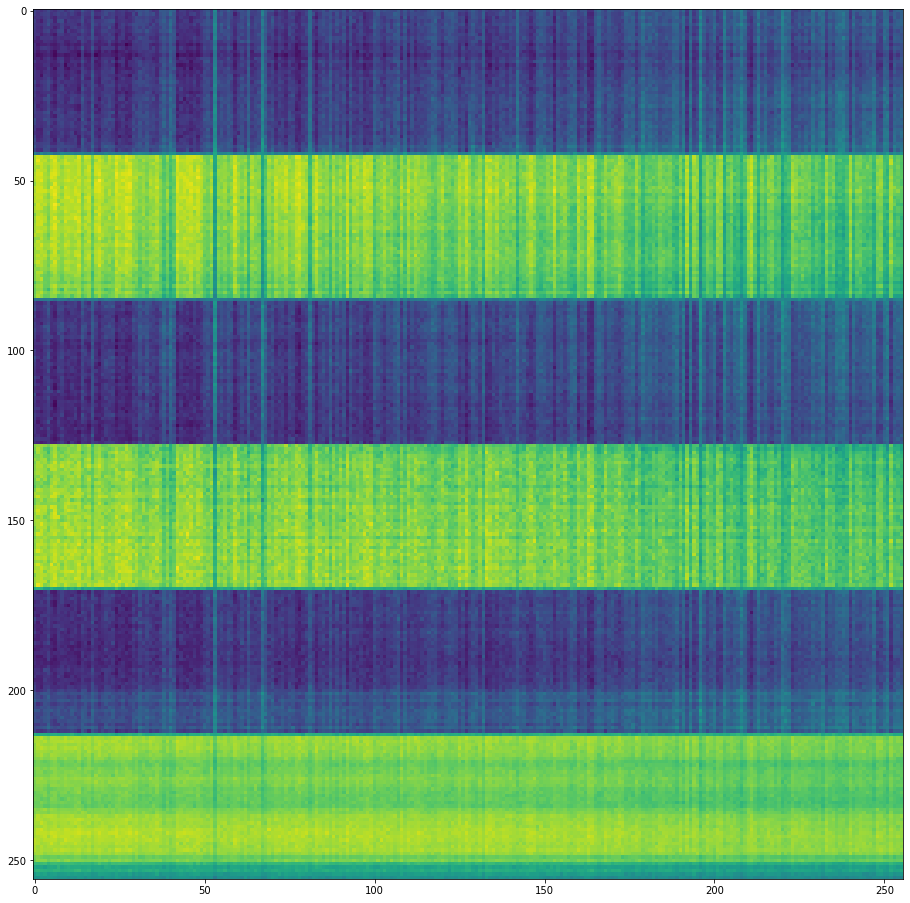

40 1a8c29114963


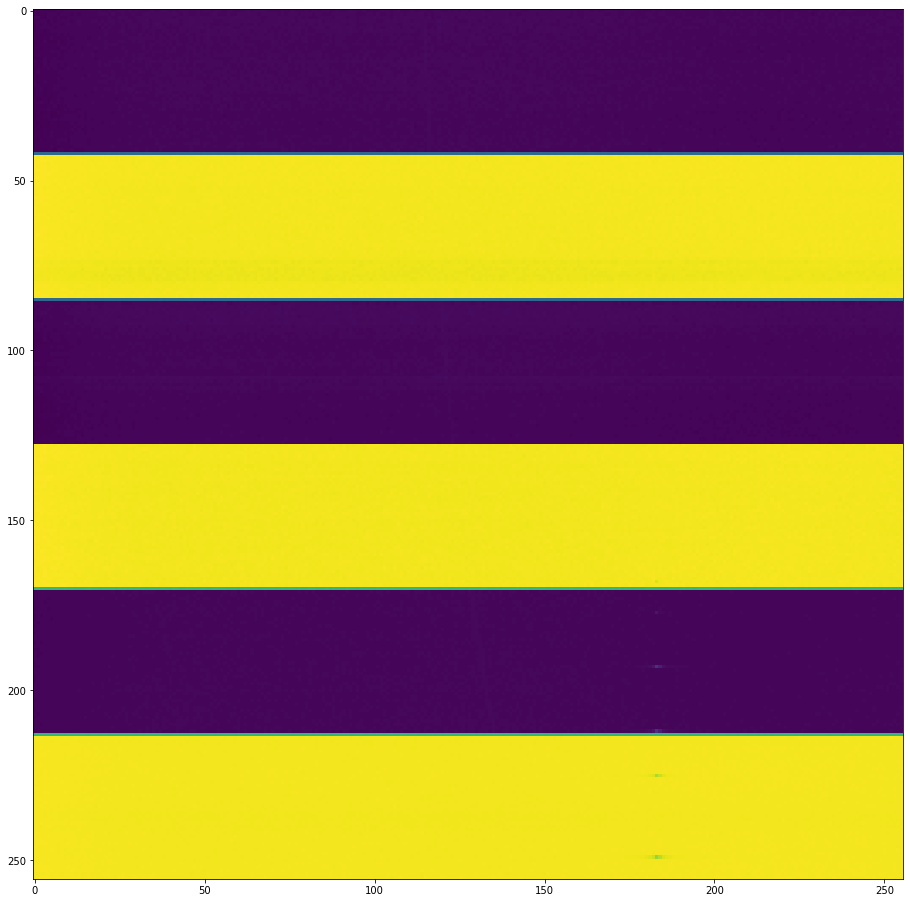

41 1c1307e5ca76


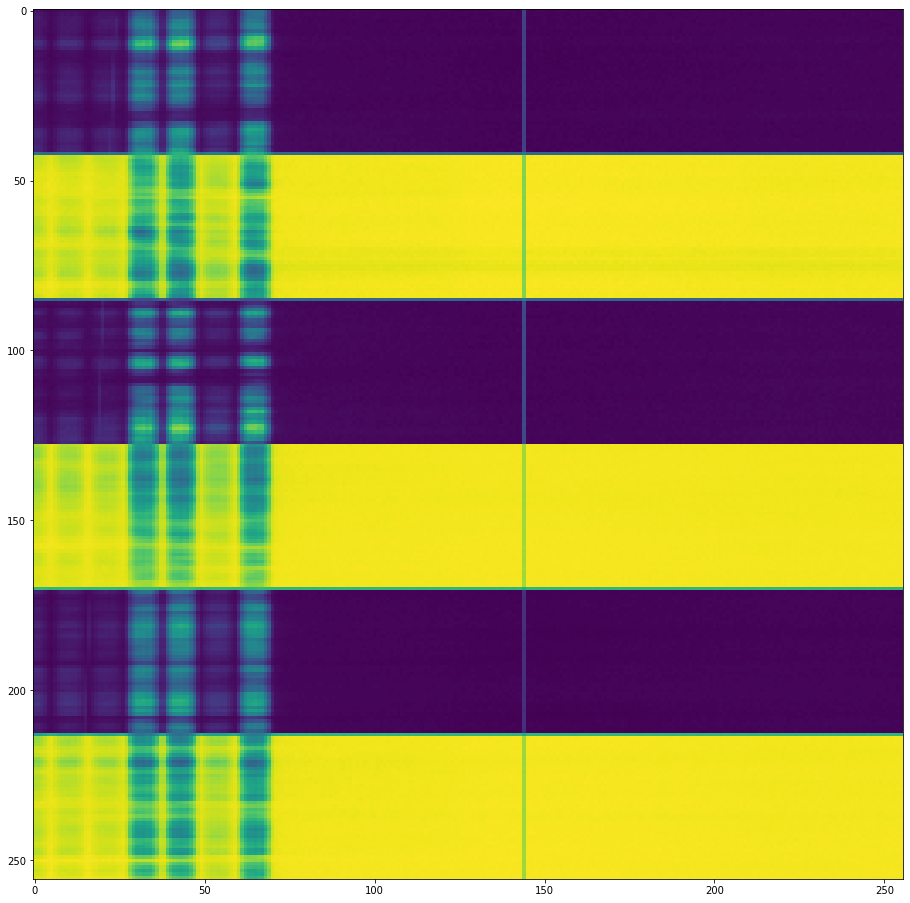

42 1c51c8bddb19


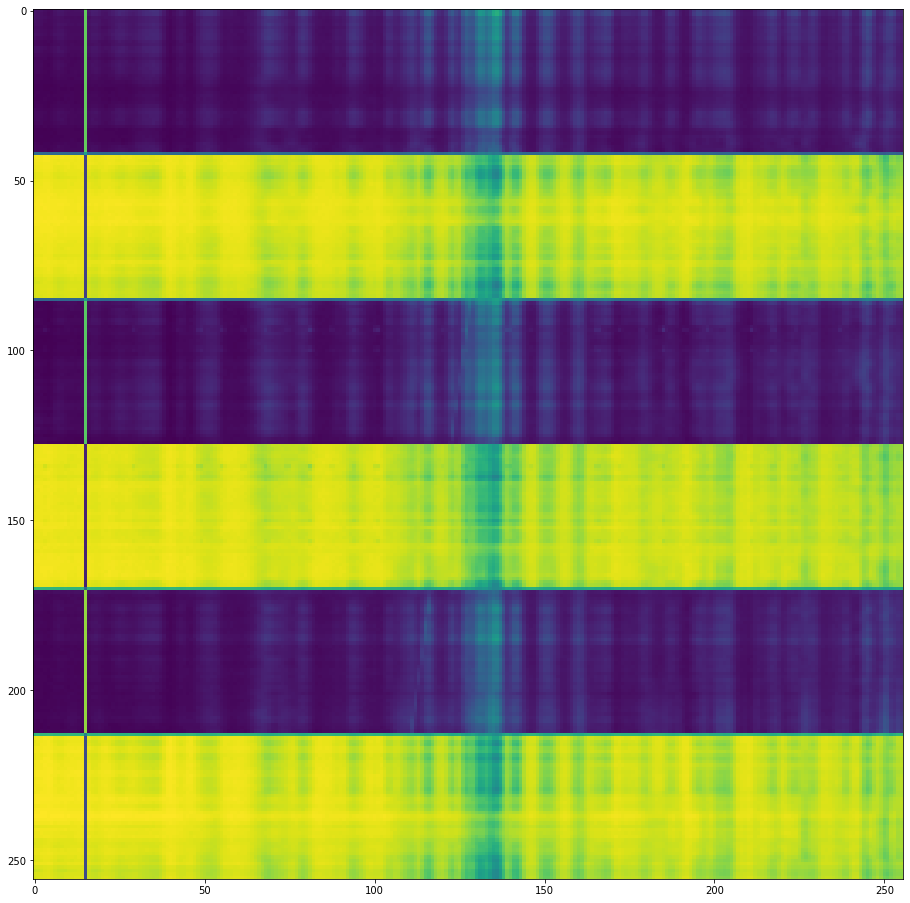

43 1d984a1a3710


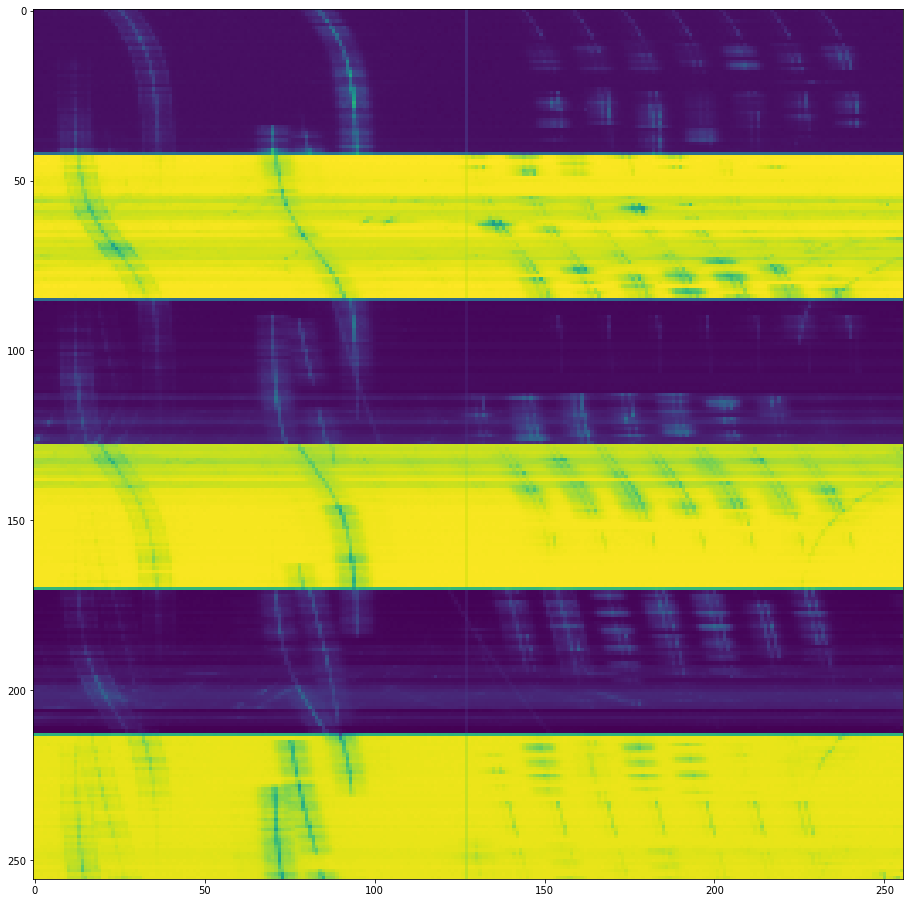

44 1fe837ffded1


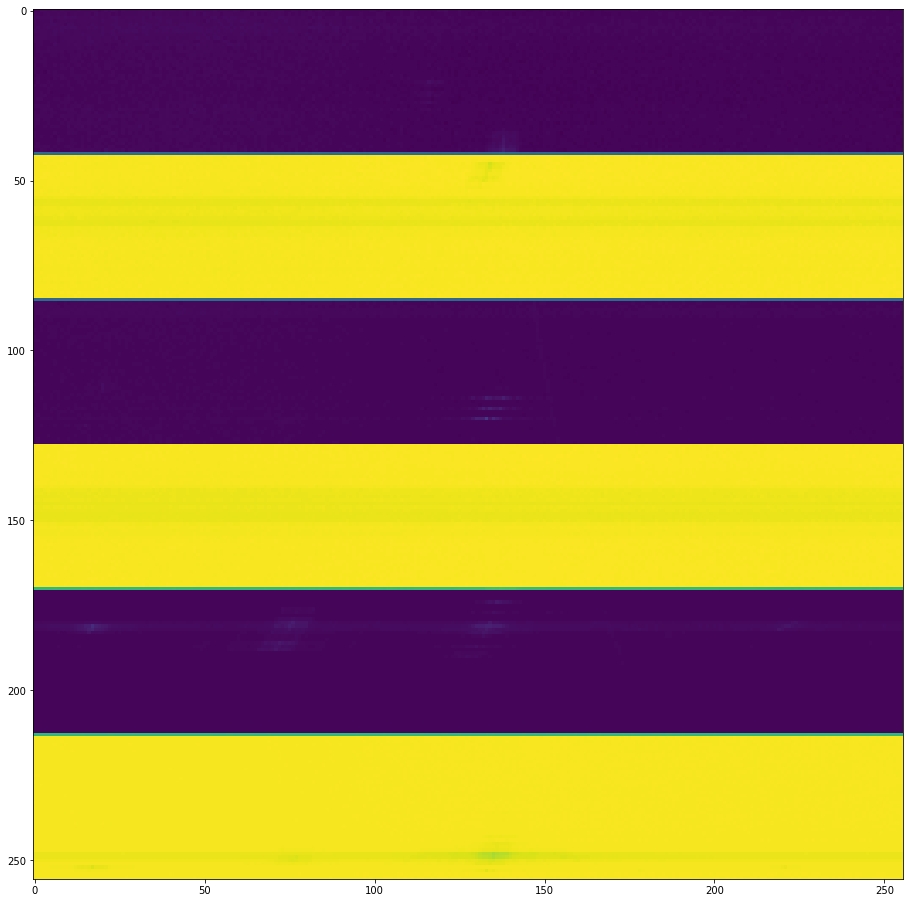

45 1fecdaef44e8


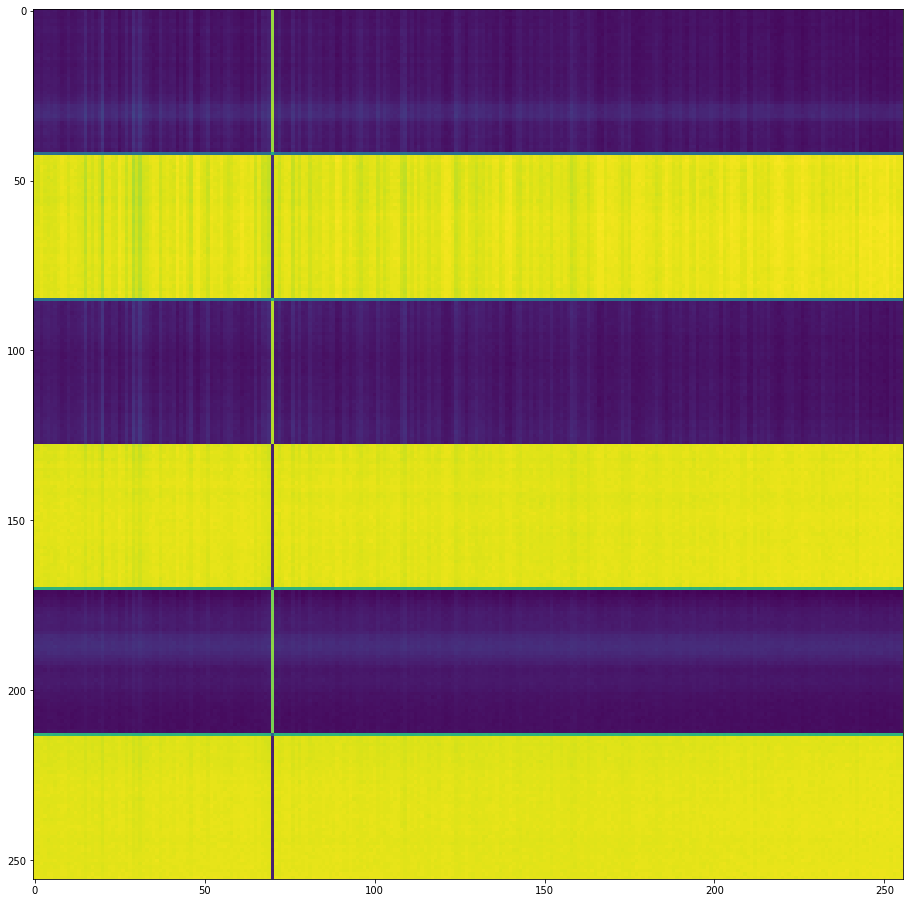

46 2064d5ebe9b5


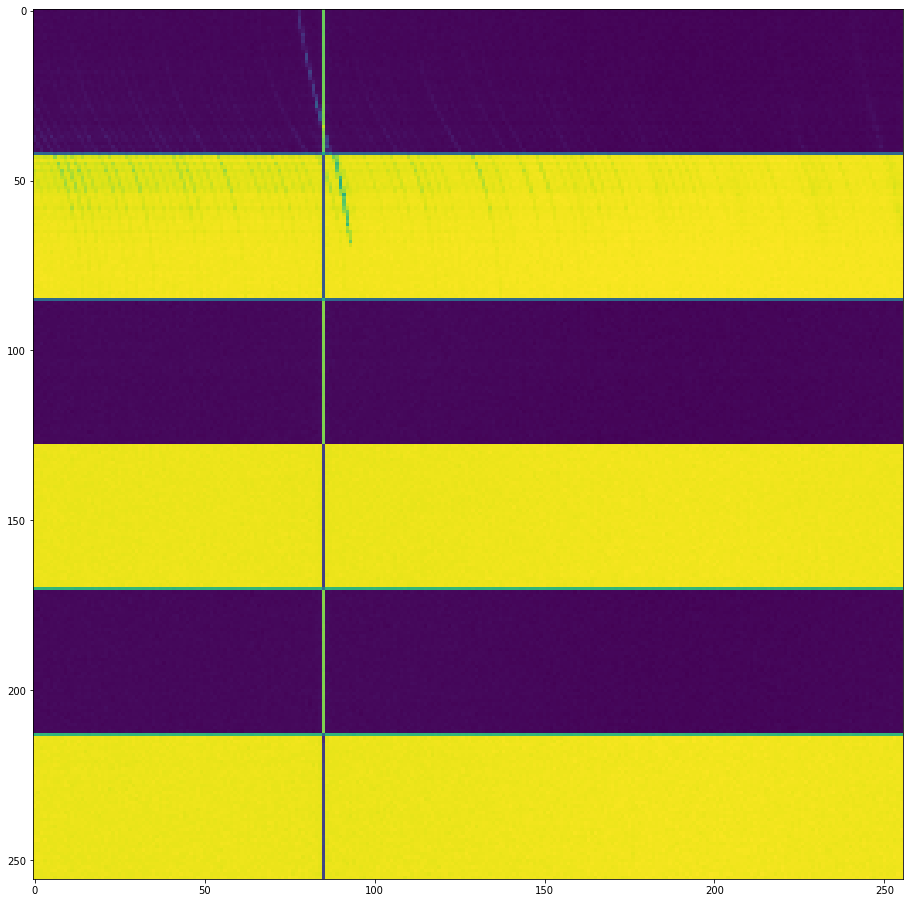

47 20bbc9da4bb2


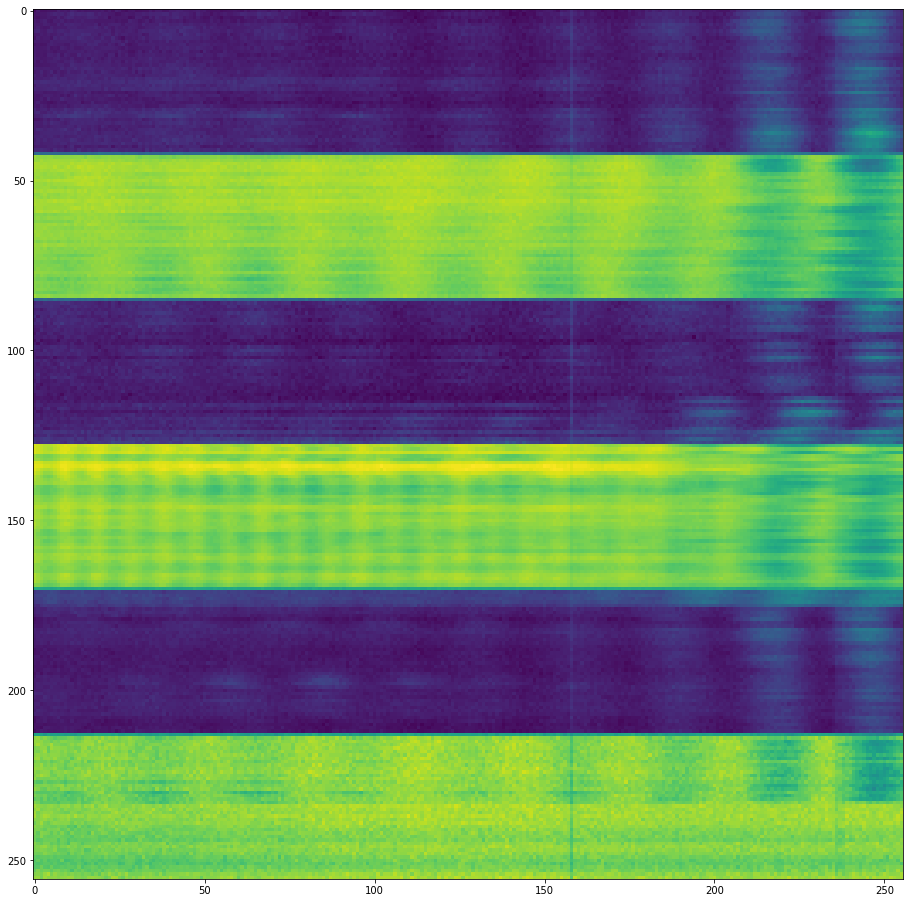

48 2304ead6f8e5


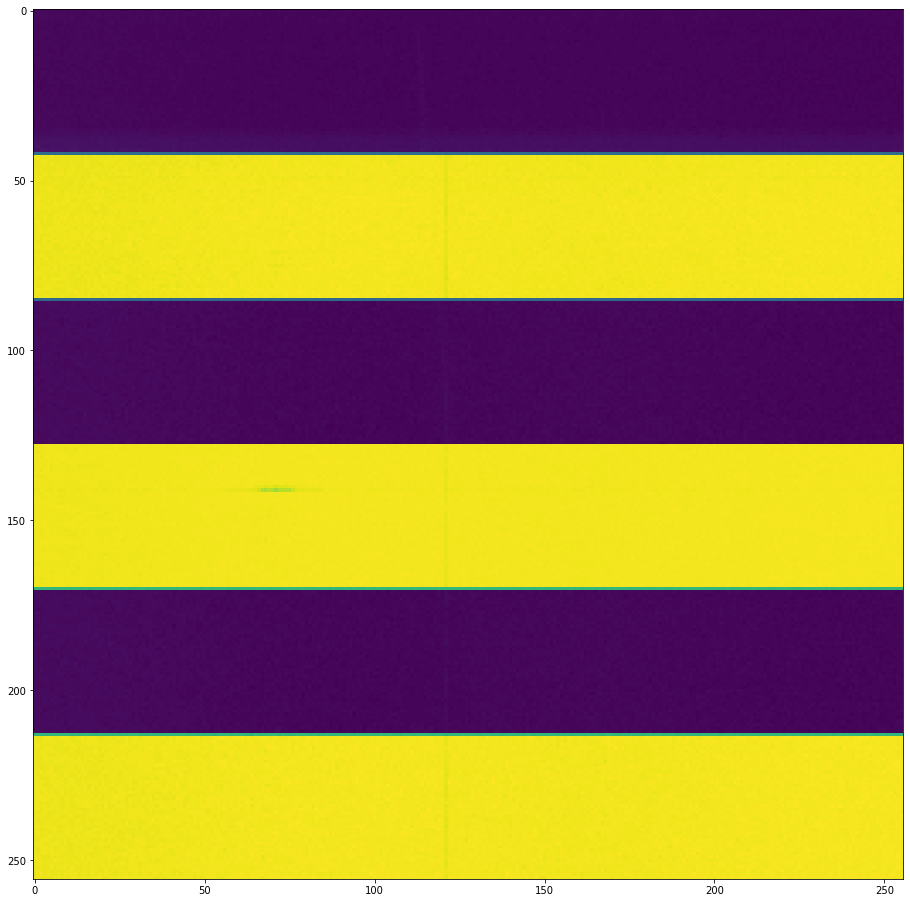

49 24349b96ea8d


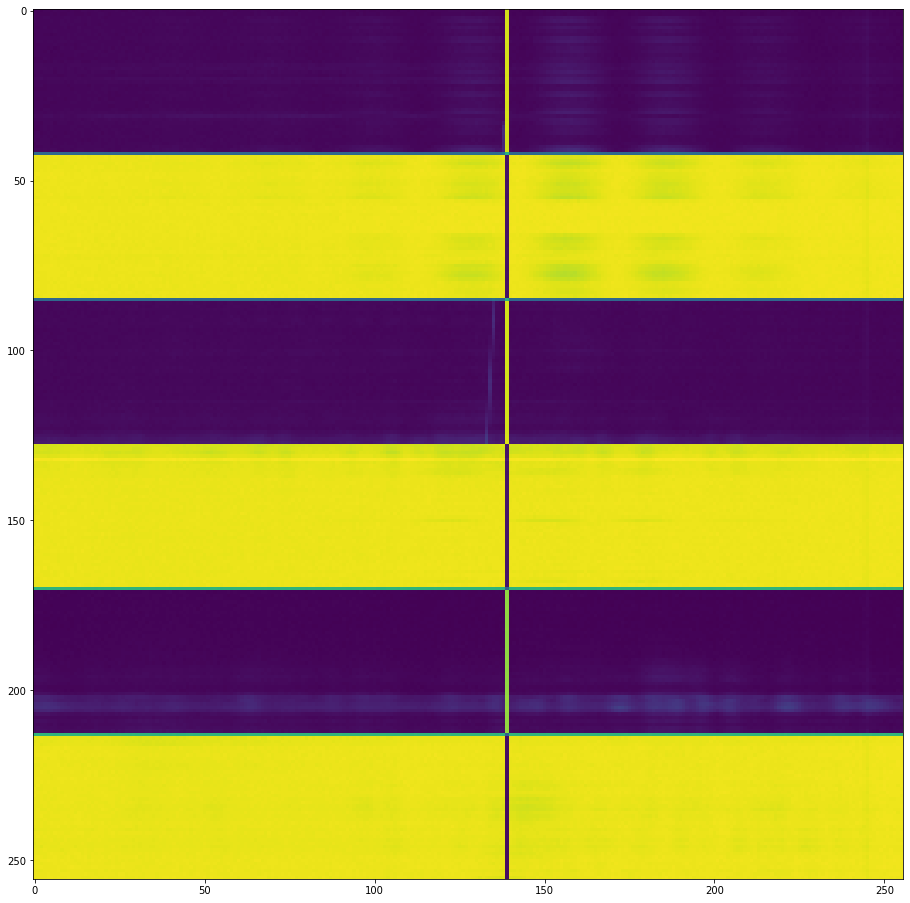

In [96]:
#images classified as negative but are positive 
pos_imgs = trfn.id.values
for i, img in enumerate(pos_imgs[0:50]):
    print(i, img)
    disp_image(f'{config.RESIZED_IMAGE_PATH}train/{img}.npy', (20,16))

In [53]:
trl = pd.read_csv(f'{config.DATA_PATH}train_labels.csv')
trlp = trl[trl['target'] == 1]
trln = trl[trl['target'] == 0]
trln.query(f'''id == '1ba80569438e' ''')

,id,target
5470,1ba80569438e,0


In [56]:
trl = pd.read_csv(f'{config.DATA_PATH}train_labels.csv')
trlp = trl[trl['target'] == 1]
trln = trl[trl['target'] == 0]
trlp.query(f'''id == '00667e94a985' ''')

,id,target
76,00667e94a985,1


In [208]:
# trying to enhance needle
import cv2
import albumentations as A
from PIL import Image

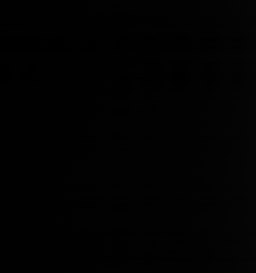

In [214]:
pilimg.show()

In [237]:
i = '0078157399c9'
img = np.load(f'{config.DATA_PATH}train/{i[0]}/{i}.npy')[0].astype(float)
# img = np.amax(img) - img

In [240]:
np.max(img)

1.0

In [230]:
len(np.unique(img))

12681

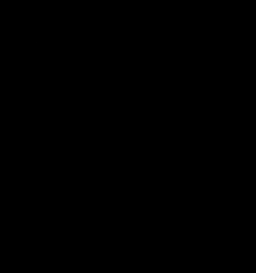

In [245]:
p = Image.fromarray(img)
p.show()

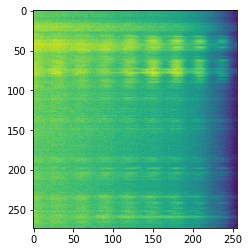

In [244]:
plt.imshow(img)
plt.show()

In [269]:
!pip install -U git+https://github.com/albu/albumentations --no-cache-dir

  Cloning https://github.com/albu/albumentations to /tmp/pip-req-build-uybuuhhk
  Running command git clone -q https://github.com/albu/albumentations /tmp/pip-req-build-uybuuhhk
  Created wheel for albumentations: filename=albumentations-1.0.0-py3-none-any.whl size=98141 sha256=05c8a485103deafde76af6721f95ac8af785b2bc2ca40cae375aa5d8b2a157f8
  Stored in directory: /tmp/pip-ephem-wheel-cache-eytguoli/wheels/c5/ca/df/fae131e2d3a8174cd8668f10bf0591fa158f0824214d3017bc
Successfully built albumentations
  Attempting uninstall: decorator
    Found existing installation: decorator 5.0.9
    Uninstalling decorator-5.0.9:
      Successfully uninstalled decorator-5.0.9
  Attempting uninstall: albumentations
    Found existing installation: albumentations 0.5.2
    Uninstalling albumentations-0.5.2:
      Successfully uninstalled albumentations-0.5.2


folder exists, make sure this call is from inference.py
original


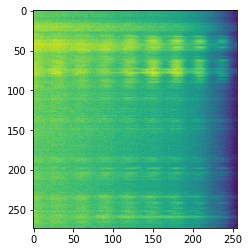

aug


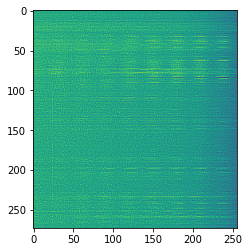

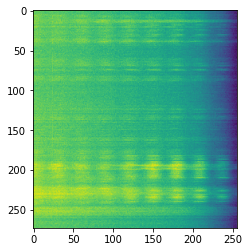

In [1]:
import albumentations as B
import numpy as np
import config
import matplotlib.pyplot as plt
import cv2
i = '0078157399c9'
img = np.load(f'{config.DATA_PATH}train/{i[0]}/{i}.npy')[0].astype(np.float32)
img = (img - np.min(img))/(np.max(img) - np.min(img))
# img = np.max(img) - img
# print(img)


# brightness 1 -- all black
# transform = B.RandomBrightnessContrast(brightness_limit = [0, 0], contrast_limit = [0.5, 0.5], p =1)

transform = B.Sharpen(alpha = [1,1], lightness = [1, 1], p=1)
# transform = B.VerticalFlip(p=1)
# transform = B.ColorJitter(
# #                             brightness = (0.0,0.0),
#                             contrast = (0.2, 0.2),
#                             saturation = 0.2,
#                             hue = 0.2, p =1)
# transform = B.RandomToneCurve(scale = 0.4, p=1)
aug = transform(image = img)['image']
# # aug_img.shape
print('original')
plt.figure()
plt.imshow(img)
plt.show()
print('aug')
plt.figure()
plt.imshow(aug)
plt.show()

r = np.array(list(reversed(img)))
plt.imshow(r)
plt.show()


folder exists, make sure this call is from inference.py


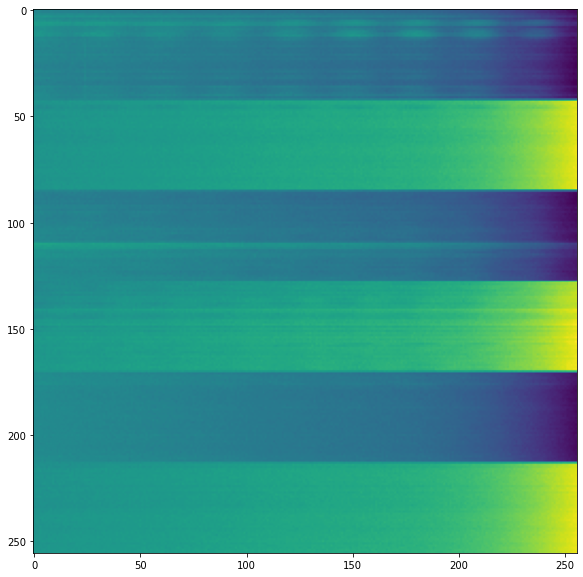

original


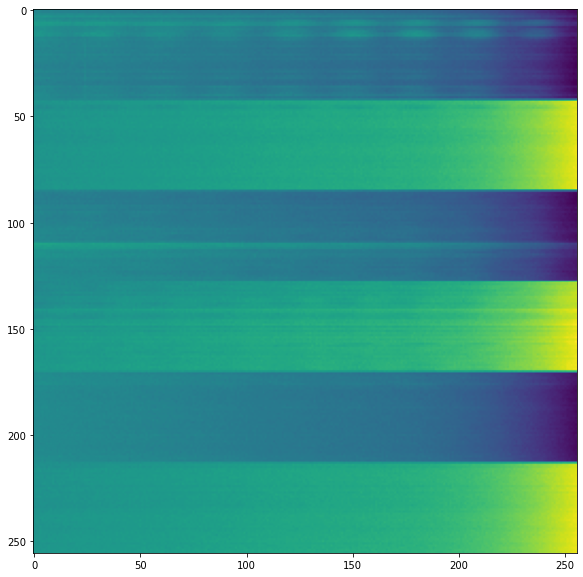

In [1]:
import dataset as q
import config
import matplotlib.pyplot as plt
i = q.SetiDataset([f'{config.DATA_PATH}train/0/0078157399c9.npy'], targets = [1], ids =[0], resize=None, augmentations = True)[0]
# print(i)
plt.figure(figsize = (20,10))
plt.imshow(i['images'][0])
plt.show()
print('original')
plt.figure(figsize = (20,10))
asf = q.SetiDataset([f'{config.DATA_PATH}train/0/0078157399c9.npy'], targets = [1], ids =[0], resize=None, augmentations = None)[0]
plt.imshow(asf['images'][0])
plt.show()

In [31]:
#display original image
def disp_origimage(image_path):
    img = np.load(image_path)
    for i in range(6):
        print(i)
        plt.figure(figsize = (16,10))
        plt.imshow(img[i].astype(float))
        plt.show()
# show fn in original size    
i = trfn.id.values[1]
print(i)
disp_origimage(f'{config.DATA_PATH}train/{i[0]}/{i}.npy')

NameError: name 'trfn' is not defined

{'images': tensor([[[ 2.1016,  0.3325, -0.3000,  ..., 11.1484, 12.3594, 11.8125],
         [ 1.3271,  0.9209, -0.9380,  ..., 11.5469, 11.3125, 11.8984],
         [ 2.2266, -0.2681, -0.8906,  ..., 10.4219, 12.1328, 10.9219],
         ...,
         [ 1.5117,  1.3037, -0.2009,  ..., 10.3438,  9.4141,  9.6562],
         [ 1.2793,  1.0586,  0.3479,  ...,  9.6562, 10.6250,  8.9219],
         [ 2.2500,  2.1797,  0.1114,  ...,  8.8906, 10.7266,  7.4727]]]), 'targets': tensor(1), 'ids': tensor(0, dtype=torch.int32)}


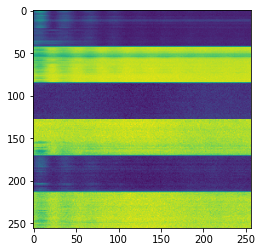

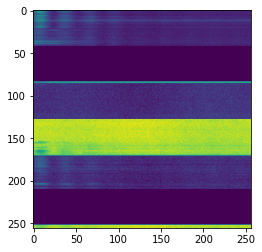

In [27]:
import designimg as di
import config
import dataset as ds
designImage = di.DesignImage(images_set = 'test', out_image_size= config.IMAGE_SIZE,  chl_pos_in_spatial = [0,1,2,3,4,5])
im = designImage.simple_concat(designImage.image_paths[1212])
imt = ds.ImageTransform(im)
# aug = imt.album()
aug = imt.drop_channels(p = 1)
plt.imshow(im)
plt.show()
plt.imshow(aug)
plt.show()

In [12]:
import dataset as q
import config
import matplotlib.pyplot as plt
i = q.SetiDataset([(designImage.image_paths[34])], targets = [1], ids =[0], resize=None, augmentations = True)[0]
# print(i)
plt.figure(figsize = (20,10))
plt.imshow(i['images'][0])
plt.show()
print('original')
plt.figure(figsize = (20,10))
asf = q.SetiDataset([f'{config.DATA_PATH}train/0/0078157399c9.npy'], targets = [1], ids =[0], resize=None, augmentations = None)[0]
plt.imshow(asf['images'][0])
plt.show()

error: OpenCV(4.5.2) :-1: error: (-5:Bad argument) in function 'filter2D'
> Overload resolution failed:
>  - src data type = 23 is not supported
>  - Expected Ptr<cv::UMat> for argument 'src'
